In [1]:
import torch
import numpy as np
import pandas as pd
from torch import nn, optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from transformers import DistilBertTokenizer, DistilBertModel
import tensorflow_hub as hub
import librosa
import ffmpeg
import whisper
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications import MobileNetV2
from tqdm import tqdm  # Import tqdm for progress bar
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score
from torch.utils.data import DataLoader, TensorDataset

# Device setup (Force CPU)
device = torch.device("cpu")
print("Running on CPU")

# Force TensorFlow to only use CPU (ignore GPU)
import tensorflow as tf
tf.config.set_visible_devices([], 'GPU')  # Hide GPU devices
print("TensorFlow is using CPU.")

# Clear any existing TensorFlow session
tf.keras.backend.clear_session()

2025-04-20 13:01:26.739298: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-20 13:01:26.913632: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-20 13:01:27.780172: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /media/zianraian/Work/anaconda3/opencv_build/install/lib:/usr/local/cuda-11.2/lib64::/usr/local/cuda/lib64
2025-04-20 13:01:27.780313: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not loa

Running on CPU
TensorFlow is using CPU.


2025-04-20 13:01:29.562306: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-04-20 13:01:29.564902: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-04-20 13:01:29.565304: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [2]:
# Load pre-trained models (PyTorch for text and TensorFlow for audio/video)
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
distilbert_model = DistilBertModel.from_pretrained('distilbert-base-uncased').to(device)
yamnet_model = hub.load("https://tfhub.dev/google/yamnet/1")  # Audio embeddings
whisper_model = whisper.load_model("base", device="cpu")  # Load Whisper model on CPU to avoid GPU memory issues
video_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")  # Video model (TensorFlow)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.bias', 'vocab_transform.weight']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSeq

In [3]:
# Feature extraction functions
def extract_text_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512).to(device)
    outputs = distilbert_model(**inputs)
    text_emb = outputs.last_hidden_state[:, 0, :].cpu().detach().numpy().flatten()
    print(f"Text embedding size: {text_emb.shape}")  # Show text vector size
    return text_emb

def extract_audio_embedding(audio_path):
    waveform, _ = librosa.load(audio_path, sr=16000, duration=30)  # Limit duration to 30 seconds
    _, embeddings, _ = yamnet_model(waveform)
    audio_emb = np.mean(embeddings.numpy(), axis=0)
    print(f"Audio embedding size: {audio_emb.shape}")  # Show audio vector size
    return audio_emb

def extract_video_embedding(video_path, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    frames = []
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)
    for idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (224, 224)) / 255.0
        frames.append(frame)
    cap.release()
    if not frames:
        return np.zeros(1024)
    embeddings = video_model.predict(np.array(frames), batch_size=1)  # Use batch_size=1 for simplicity
    video_emb = np.mean(embeddings, axis=0)
    print(f"Video embedding size: {video_emb.shape}")  # Show video vector size
    return video_emb

def extract_text_from_video(video_path):
    audio_output = video_path.replace(".mp4", ".wav")
    try:
        ffmpeg.input(video_path).output(audio_output, format="wav").run(overwrite_output=True)
        result = whisper_model.transcribe(audio_output)
        return result["text"]
    except Exception as e:
        print(f"Whisper ASR failed for {video_path}: {e}")
        return ""


In [4]:
import os# Load Dataset and Extract Features
data = []
dataset_path = "/home/zianraian/dataset"
categories = ["sarcastic", "nonsarcastic"]

for category in categories:
    folder_path = os.path.join(dataset_path, category)
    label = 1 if category == "sarcastic" else 0
    for video in tqdm(os.listdir(folder_path), desc=f"Processing {category}"):
        if not video.endswith(".mp4"):
            continue
        video_path = os.path.join(folder_path, video)
        try:
            text = extract_text_from_video(video_path)
            text_emb = extract_text_embedding(text)
            audio_emb = extract_audio_embedding(video_path)
            video_emb = extract_video_embedding(video_path)
            
            # Normalize each embedding before combining them
            text_emb = (text_emb - np.mean(text_emb)) / np.std(text_emb)
            audio_emb = (audio_emb - np.mean(audio_emb)) / np.std(audio_emb)
            video_emb = (video_emb - np.mean(video_emb)) / np.std(video_emb)
            
            # Check the size of each individual modality embedding before concatenation
            print(f"After normalization - Text embedding size: {text_emb.shape}")
            print(f"After normalization - Audio embedding size: {audio_emb.shape}")
            print(f"After normalization - Video embedding size: {video_emb.shape}")
            
            # Combine embeddings
            combined_embedding = np.concatenate([text_emb, audio_emb, video_emb])
            print(f"Combined embedding size: {combined_embedding.shape}")  # Show concatenated vector size
            data.append({"video_id": video, "embedding": combined_embedding, "label": label})
        except Exception as e:
            print(f"Error processing {video}: {e}")
            continue

df = pd.DataFrame(data)
df.to_pickle("embeddings2.pkl")
df.to_csv("embeddings2.csv", index=False)

Processing sarcastic:   0%|                             | 0/763 [00:00<?, ?it/s]ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 21ms/step


Processing sarcastic:   0%|                   | 1/763 [00:07<1:37:13,  7.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:   0%|                   | 2/763 [00:12<1:13:10,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   0%|                   | 3/763 [00:15<1:00:26,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:   1%|                     | 4/763 [00:19<55:45,  4.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   1%|▏                    | 5/763 [00:24<56:03,  4.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   1%|▏                    | 6/763 [00:28<56:43,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   1%|▏                    | 7/763 [00:32<54:58,  4.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   1%|▏                    | 8/763 [00:38<58:33,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   1%|▏                    | 9/763 [00:41<55:37,  4.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   1%|▎                   | 10/763 [00:45<53:36,  4.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:   1%|▎                   | 11/763 [00:50<53:58,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   2%|▎                   | 12/763 [00:53<51:39,  4.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:   2%|▎                   | 13/763 [00:58<52:40,  4.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   2%|▎                   | 14/763 [01:02<52:22,  4.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   2%|▍                   | 15/763 [01:07<54:42,  4.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:   2%|▍                   | 16/763 [01:12<57:23,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:   2%|▍                   | 17/763 [01:17<59:40,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:   2%|▍                 | 18/763 [01:24<1:05:13,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   2%|▍                 | 19/763 [01:29<1:05:18,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:   3%|▌                   | 20/763 [01:33<59:58,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:   3%|▍                 | 21/763 [01:39<1:06:05,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing sarcastic:   3%|▌                 | 22/763 [01:46<1:10:47,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   3%|▌                 | 23/763 [01:54<1:19:59,  6.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   3%|▌                 | 24/763 [01:58<1:09:59,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   3%|▌                 | 25/763 [02:02<1:04:03,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   3%|▋                   | 26/763 [02:06<58:47,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:   4%|▋                   | 27/763 [02:10<57:38,  4.70s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   4%|▋                 | 28/763 [02:16<1:02:00,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:   4%|▋                 | 29/763 [02:21<1:01:33,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   4%|▊                   | 30/763 [02:25<58:50,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:   4%|▋                 | 31/763 [02:31<1:01:08,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:   4%|▊                 | 32/763 [02:36<1:01:35,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   4%|▊                   | 33/763 [02:41<59:11,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   4%|▉                   | 34/763 [02:45<56:25,  4.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:   5%|▉                   | 35/763 [02:50<57:28,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   5%|▊                 | 36/763 [02:56<1:02:29,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   5%|▊                 | 37/763 [03:03<1:08:16,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:   5%|▉                 | 38/763 [03:06<1:01:36,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   5%|█                   | 39/763 [03:10<57:19,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   5%|█                   | 40/763 [03:15<55:59,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:   5%|█                   | 41/763 [03:18<52:25,  4.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   6%|█                   | 42/763 [03:23<51:39,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:   6%|█▏                  | 43/763 [03:27<51:33,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   6%|█▏                  | 44/763 [03:32<53:28,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   6%|█▏                  | 45/763 [03:35<49:26,  4.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   6%|█▏                  | 46/763 [03:41<56:47,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:   6%|█▏                  | 47/763 [03:45<54:30,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   6%|█▎                  | 48/763 [03:50<55:54,  4.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:   6%|█▎                  | 49/763 [03:55<54:30,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   7%|█▏                | 50/763 [04:01<1:00:40,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   7%|█▎                  | 51/763 [04:05<56:45,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   7%|█▎                  | 52/763 [04:10<56:04,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   7%|█▍                  | 53/763 [04:14<55:50,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:   7%|█▍                  | 54/763 [04:18<53:45,  4.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   7%|█▍                  | 55/763 [04:24<56:20,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   7%|█▍                  | 56/763 [04:28<53:46,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   7%|█▍                  | 57/763 [04:33<57:23,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:   8%|█▌                  | 58/763 [04:38<56:02,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:   8%|█▌                  | 59/763 [04:43<57:03,  4.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:   8%|█▌                  | 60/763 [04:48<57:53,  4.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:   8%|█▌                  | 61/763 [04:53<56:57,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:   8%|█▋                  | 62/763 [04:58<57:23,  4.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:   8%|█▍                | 63/763 [05:08<1:16:58,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:   8%|█▌                | 64/763 [05:13<1:10:53,  6.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   9%|█▌                | 65/763 [05:18<1:06:10,  5.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:   9%|█▌                | 66/763 [05:23<1:04:35,  5.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   9%|█▌                | 67/763 [05:28<1:01:03,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:   9%|█▌                | 68/763 [05:33<1:00:49,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   9%|█▋                | 69/763 [05:38<1:00:29,  5.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:   9%|█▊                  | 70/763 [05:43<57:08,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:   9%|█▋                | 71/763 [05:49<1:03:10,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:   9%|█▋                | 72/763 [05:54<1:00:30,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  10%|█▉                  | 73/763 [05:58<55:57,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  10%|█▉                  | 74/763 [06:03<54:53,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  10%|█▉                  | 75/763 [06:07<52:51,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  10%|█▉                  | 76/763 [06:12<54:38,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  10%|██                  | 77/763 [06:17<54:36,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  10%|█▊                | 78/763 [06:28<1:18:06,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  10%|█▊                | 79/763 [06:32<1:07:22,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  10%|█▉                | 80/763 [06:37<1:04:48,  5.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  11%|█▉                | 81/763 [06:42<1:00:10,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  11%|██▏                 | 82/763 [06:46<58:18,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  11%|██▏                 | 83/763 [06:51<55:12,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  11%|██▏                 | 84/763 [06:55<52:13,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  11%|██▏                 | 85/763 [07:00<55:47,  4.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  11%|██▎                 | 86/763 [07:04<51:31,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  11%|██▎                 | 87/763 [07:09<50:49,  4.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  12%|██▎                 | 88/763 [07:13<51:20,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  12%|██▎                 | 89/763 [07:17<47:27,  4.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  12%|██▎                 | 90/763 [07:21<49:24,  4.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  12%|██▍                 | 91/763 [07:27<54:43,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  12%|██▍                 | 92/763 [07:32<54:32,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  12%|██▍                 | 93/763 [07:39<59:39,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  12%|██▍                 | 94/763 [07:44<58:38,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  12%|██▍                 | 95/763 [07:49<56:47,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  13%|██▌                 | 96/763 [07:54<59:10,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  13%|██▌                 | 97/763 [08:00<58:25,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  13%|██▌                 | 98/763 [08:05<57:44,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 46ms/step


Processing sarcastic:  13%|██▌                 | 99/763 [08:09<55:46,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  13%|██▍                | 100/763 [08:13<52:47,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  13%|██▌                | 101/763 [08:20<58:11,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  13%|██▌                | 102/763 [08:25<59:16,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  13%|██▎              | 103/763 [08:32<1:01:54,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  14%|██▌                | 104/763 [08:36<56:36,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  14%|██▌                | 105/763 [08:41<56:25,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  14%|██▋                | 106/763 [08:46<55:47,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  14%|██▋                | 107/763 [08:50<53:56,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  14%|██▋                | 108/763 [08:56<55:45,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  14%|██▋                | 109/763 [09:02<58:31,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  14%|██▋                | 110/763 [09:06<55:07,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  15%|██▊                | 111/763 [09:12<56:04,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  15%|██▊                | 112/763 [09:17<56:30,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing sarcastic:  15%|██▌              | 113/763 [09:23<1:00:02,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  15%|██▌              | 114/763 [09:29<1:00:03,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  15%|██▊                | 115/763 [09:33<56:49,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  15%|██▉                | 116/763 [09:38<53:12,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  15%|██▉                | 117/763 [09:42<51:51,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  15%|██▉                | 118/763 [09:47<50:52,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  16%|██▉                | 119/763 [09:51<49:58,  4.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  16%|██▉                | 120/763 [09:56<51:09,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  16%|███                | 121/763 [10:01<50:25,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  16%|███                | 122/763 [10:04<47:12,  4.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  16%|███                | 123/763 [10:08<45:16,  4.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  16%|███                | 124/763 [10:12<43:24,  4.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  16%|███                | 125/763 [10:17<47:11,  4.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  17%|███▏               | 126/763 [10:21<45:21,  4.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  17%|███▏               | 127/763 [10:25<44:24,  4.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  17%|███▏               | 128/763 [10:30<46:23,  4.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  17%|███▏               | 129/763 [10:34<46:11,  4.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  17%|███▏               | 130/763 [10:40<48:53,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  17%|███▎               | 131/763 [10:46<53:08,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  17%|███▎               | 132/763 [10:49<48:46,  4.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  17%|███▎               | 133/763 [10:54<50:15,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  18%|███▎               | 134/763 [11:00<53:37,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  18%|███▎               | 135/763 [11:05<52:31,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing sarcastic:  18%|███▍               | 136/763 [11:11<54:57,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing sarcastic:  18%|███              | 137/763 [11:18<1:01:17,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  18%|███              | 138/763 [11:25<1:02:53,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  18%|███▍               | 139/763 [11:29<59:03,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  18%|███              | 140/763 [11:37<1:05:04,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  18%|███▏             | 141/763 [11:43<1:03:36,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  19%|███▌               | 142/763 [11:47<57:07,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  19%|███▏             | 143/763 [11:54<1:02:01,  6.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  19%|███▌               | 144/763 [11:59<58:24,  5.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  19%|███▌               | 145/763 [12:05<59:30,  5.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  19%|███▎             | 146/763 [12:12<1:04:18,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  19%|███▋               | 147/763 [12:17<59:43,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  19%|███▋               | 148/763 [12:22<56:32,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 45ms/step


Processing sarcastic:  20%|███▋               | 149/763 [12:27<54:40,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  20%|███▋               | 150/763 [12:32<52:40,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  20%|███▊               | 151/763 [12:36<51:10,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing sarcastic:  20%|███▊               | 152/763 [12:41<49:52,  4.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  20%|███▊               | 153/763 [12:46<49:05,  4.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  20%|███▊               | 154/763 [12:51<50:11,  4.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  20%|███▊               | 155/763 [12:56<51:27,  5.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  20%|███▉               | 156/763 [13:01<50:53,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  21%|███▉               | 157/763 [13:06<50:54,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  21%|███▉               | 158/763 [13:13<54:52,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  21%|███▉               | 159/763 [13:18<54:50,  5.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  21%|███▉               | 160/763 [13:23<54:00,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  21%|████               | 161/763 [13:28<51:05,  5.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing sarcastic:  21%|████               | 162/763 [13:32<48:11,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  21%|████               | 163/763 [13:38<53:01,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  21%|████               | 164/763 [13:45<56:19,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  22%|████               | 165/763 [13:51<58:40,  5.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  22%|████▏              | 166/763 [13:57<57:35,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  22%|████▏              | 167/763 [14:02<54:12,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  22%|████▏              | 168/763 [14:07<53:38,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  22%|███▊             | 169/763 [14:22<1:21:35,  8.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  22%|███▊             | 170/763 [14:28<1:15:24,  7.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  22%|███▊             | 171/763 [14:32<1:05:41,  6.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  23%|███▊             | 172/763 [14:37<1:01:11,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  23%|███▊             | 173/763 [14:45<1:03:41,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  23%|███▉             | 174/763 [14:50<1:00:15,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  23%|████▎              | 175/763 [14:56<59:12,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  23%|████▍              | 176/763 [15:01<57:41,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing sarcastic:  23%|████▍              | 177/763 [15:07<58:12,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  23%|████▍              | 178/763 [15:13<56:15,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  23%|████▍              | 179/763 [15:18<54:42,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  24%|████▍              | 180/763 [15:23<53:47,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  24%|████▌              | 181/763 [15:28<52:17,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  24%|████▌              | 182/763 [15:33<49:49,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  24%|████▌              | 183/763 [15:38<48:53,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  24%|████▌              | 184/763 [15:42<45:52,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  24%|████▌              | 185/763 [15:49<54:11,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  24%|████▋              | 186/763 [15:54<50:37,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  25%|████▋              | 187/763 [15:58<46:54,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  25%|████▋              | 188/763 [16:06<56:05,  5.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  25%|████▋              | 189/763 [16:12<56:12,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  25%|████▋              | 190/763 [16:18<56:46,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  25%|████▎            | 191/763 [16:26<1:01:53,  6.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  25%|████▊              | 192/763 [16:30<55:55,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  25%|████▎            | 193/763 [16:50<1:34:32,  9.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  25%|████▎            | 194/763 [16:56<1:24:37,  8.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  26%|████▎            | 195/763 [17:01<1:11:23,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  26%|████▎            | 196/763 [17:06<1:04:49,  6.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  26%|████▍            | 197/763 [17:13<1:05:06,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  26%|████▍            | 198/763 [17:18<1:00:45,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  26%|████▍            | 199/763 [17:25<1:01:28,  6.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  26%|████▉              | 200/763 [17:31<59:58,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  26%|█████              | 201/763 [17:37<58:09,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  26%|█████              | 202/763 [17:41<53:34,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  27%|█████              | 203/763 [17:46<50:40,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  27%|█████              | 204/763 [17:51<49:45,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step
Video embedding size: (1280,)


Processing sarcastic:  27%|█████              | 205/763 [17:59<57:21,  6.17s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing sarcastic:  27%|█████▏             | 206/763 [18:05<55:50,  6.02s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  27%|█████▏             | 207/763 [18:10<52:38,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  27%|█████▏             | 208/763 [18:16<53:22,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  27%|█████▏             | 209/763 [18:20<48:08,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  28%|█████▏             | 210/763 [18:24<43:59,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  28%|█████▎             | 211/763 [18:30<48:43,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  28%|█████▎             | 212/763 [18:36<51:14,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  28%|█████▎             | 213/763 [18:41<48:26,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  28%|█████▎             | 214/763 [18:45<45:08,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  28%|█████▎             | 215/763 [18:50<43:55,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  28%|█████▍             | 216/763 [18:54<41:58,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  28%|█████▍             | 217/763 [18:59<43:37,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  29%|█████▍             | 218/763 [19:05<46:52,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  29%|█████▍             | 219/763 [19:09<44:40,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  29%|█████▍             | 220/763 [19:14<43:03,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  29%|█████▌             | 221/763 [19:19<43:36,  4.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  29%|█████▌             | 222/763 [19:23<41:28,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  29%|█████▌             | 223/763 [19:29<45:16,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  29%|█████▌             | 224/763 [19:33<42:59,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  29%|█████▌             | 225/763 [19:37<41:54,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  30%|█████▋             | 226/763 [19:43<44:18,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  30%|█████▋             | 227/763 [19:49<46:17,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  30%|█████▋             | 228/763 [19:55<48:42,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  30%|█████▋             | 229/763 [19:59<44:45,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  30%|█████▋             | 230/763 [20:03<42:31,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  30%|█████▊             | 231/763 [20:10<47:20,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  30%|█████▊             | 232/763 [20:16<49:05,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  31%|█████▊             | 233/763 [20:20<45:26,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  31%|█████▊             | 234/763 [20:27<50:23,  5.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  31%|█████▊             | 235/763 [20:32<47:43,  5.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  31%|█████▉             | 236/763 [20:37<48:18,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  31%|█████▉             | 237/763 [20:42<45:20,  5.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  31%|█████▉             | 238/763 [20:46<41:40,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  31%|█████▉             | 239/763 [20:50<40:48,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  31%|█████▉             | 240/763 [20:55<41:52,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  32%|██████             | 241/763 [20:59<38:58,  4.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  32%|██████             | 242/763 [21:03<37:20,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  32%|██████             | 243/763 [21:07<37:06,  4.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  32%|██████             | 244/763 [21:18<54:02,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  32%|██████             | 245/763 [21:22<47:24,  5.49s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  32%|██████▏            | 246/763 [21:25<41:45,  4.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  32%|██████▏            | 247/763 [21:30<43:03,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  33%|██████▏            | 248/763 [21:34<40:49,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  33%|██████▏            | 249/763 [21:42<48:39,  5.68s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  33%|██████▏            | 250/763 [21:47<45:29,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  33%|██████▎            | 251/763 [21:52<46:00,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  33%|██████▎            | 252/763 [21:56<41:27,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  33%|██████▎            | 253/763 [22:01<40:52,  4.81s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  33%|██████▎            | 254/763 [22:04<38:16,  4.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  33%|██████▎            | 255/763 [22:10<39:34,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  34%|██████▎            | 256/763 [22:14<38:54,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  34%|██████▍            | 257/763 [22:18<37:54,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  34%|██████▍            | 258/763 [22:24<40:16,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  34%|██████▍            | 259/763 [22:28<39:09,  4.66s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  34%|██████▍            | 260/763 [22:33<39:27,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  34%|██████▍            | 261/763 [22:36<35:58,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  34%|██████▌            | 262/763 [22:43<42:09,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  34%|██████▌            | 263/763 [22:47<39:02,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  35%|██████▌            | 264/763 [22:50<35:48,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  35%|██████▌            | 265/763 [22:54<34:27,  4.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  35%|██████▌            | 266/763 [22:58<34:54,  4.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  35%|██████▋            | 267/763 [23:02<34:22,  4.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  35%|██████▋            | 268/763 [23:06<32:50,  3.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 41ms/step
Video embedding size: (1280,)


Processing sarcastic:  35%|██████▋            | 269/763 [23:10<33:15,  4.04s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  35%|██████▋            | 270/763 [23:15<34:15,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  36%|██████▋            | 271/763 [23:19<34:26,  4.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  36%|██████▊            | 272/763 [23:23<34:55,  4.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  36%|██████▊            | 273/763 [23:27<33:41,  4.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  36%|██████▊            | 274/763 [23:33<38:32,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  36%|██████▊            | 275/763 [23:38<37:47,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  36%|██████▊            | 276/763 [23:42<37:02,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  36%|██████▉            | 277/763 [23:47<36:40,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  36%|██████▉            | 278/763 [23:50<34:08,  4.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  37%|██████▉            | 279/763 [23:54<32:53,  4.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  37%|██████▉            | 280/763 [23:58<32:42,  4.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  37%|██████▉            | 281/763 [24:01<31:32,  3.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  37%|███████            | 282/763 [24:06<31:54,  3.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  37%|███████            | 283/763 [24:15<44:46,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  37%|███████            | 284/763 [24:20<43:26,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  37%|███████            | 285/763 [24:23<38:22,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  37%|███████            | 286/763 [24:27<36:35,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  38%|███████▏           | 287/763 [24:34<40:04,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  38%|███████▏           | 288/763 [24:38<38:07,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  38%|███████▏           | 289/763 [24:42<36:15,  4.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  38%|███████▏           | 290/763 [24:46<35:18,  4.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  38%|███████▏           | 291/763 [24:51<36:14,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  38%|███████▎           | 292/763 [24:55<35:49,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step
Video embedding size: (1280,)


Processing sarcastic:  38%|███████▎           | 293/763 [25:00<35:38,  4.55s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  39%|███████▎           | 294/763 [25:06<37:53,  4.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  39%|███████▎           | 295/763 [25:11<39:03,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  39%|███████▎           | 296/763 [25:16<39:13,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  39%|███████▍           | 297/763 [25:21<38:13,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  39%|███████▍           | 298/763 [25:26<37:54,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  39%|███████▍           | 299/763 [25:29<35:21,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  39%|███████▍           | 300/763 [25:34<34:43,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  39%|███████▍           | 301/763 [25:39<36:10,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  40%|███████▌           | 302/763 [25:42<33:26,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  40%|███████▌           | 303/763 [25:48<36:13,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  40%|███████▌           | 304/763 [25:53<36:28,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  40%|███████▌           | 305/763 [25:57<34:27,  4.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  40%|███████▌           | 306/763 [26:01<33:58,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  40%|███████▋           | 307/763 [26:05<33:01,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  40%|███████▋           | 308/763 [26:10<33:33,  4.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  40%|███████▋           | 309/763 [26:15<34:44,  4.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  41%|███████▋           | 310/763 [26:19<32:52,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  41%|███████▋           | 311/763 [26:22<30:18,  4.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  41%|███████▊           | 312/763 [26:26<31:20,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  41%|███████▊           | 313/763 [26:30<29:36,  3.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  41%|███████▊           | 314/763 [26:35<32:08,  4.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  41%|███████▊           | 315/763 [26:40<33:31,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  41%|███████▊           | 316/763 [26:44<33:43,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  42%|███████▉           | 317/763 [26:50<35:09,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  42%|███████▉           | 318/763 [26:54<34:20,  4.63s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  42%|███████▉           | 319/763 [26:58<33:30,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  42%|███████▉           | 320/763 [27:02<31:20,  4.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  42%|███████▉           | 321/763 [27:06<31:35,  4.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  42%|████████           | 322/763 [27:10<31:20,  4.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  42%|████████           | 323/763 [27:16<34:37,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  42%|████████           | 324/763 [27:21<35:26,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  43%|████████           | 325/763 [27:25<32:58,  4.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  43%|████████           | 326/763 [27:32<37:00,  5.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  43%|████████▏          | 327/763 [27:36<35:21,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  43%|████████▏          | 328/763 [27:39<32:18,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  43%|████████▏          | 329/763 [27:44<31:56,  4.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  43%|████████▏          | 330/763 [27:48<31:14,  4.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  43%|████████▏          | 331/763 [27:54<34:08,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 19ms/step


Processing sarcastic:  44%|████████▎          | 332/763 [27:58<33:44,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  44%|████████▎          | 333/763 [28:03<33:01,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  44%|████████▎          | 334/763 [28:07<31:49,  4.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  44%|████████▎          | 335/763 [28:12<33:28,  4.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  44%|████████▎          | 336/763 [28:15<30:58,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  44%|████████▍          | 337/763 [28:21<33:01,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  44%|████████▍          | 338/763 [28:26<33:20,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  44%|████████▍          | 339/763 [28:31<33:52,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  45%|████████▍          | 340/763 [28:35<32:37,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  45%|████████▍          | 341/763 [28:39<31:38,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  45%|████████▌          | 342/763 [28:45<33:50,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  45%|████████▌          | 343/763 [28:48<31:06,  4.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  45%|████████▌          | 344/763 [28:52<29:13,  4.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  45%|████████▌          | 345/763 [28:57<30:51,  4.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  45%|████████▌          | 346/763 [29:01<30:26,  4.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  45%|████████▋          | 347/763 [29:07<33:22,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  46%|████████▋          | 348/763 [29:12<32:50,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  46%|████████▋          | 349/763 [29:18<35:28,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  46%|████████▋          | 350/763 [29:24<37:30,  5.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  46%|████████▋          | 351/763 [29:29<37:05,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  46%|████████▊          | 352/763 [29:33<34:43,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  46%|████████▊          | 353/763 [29:38<33:19,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  46%|████████▊          | 354/763 [29:43<33:17,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  47%|████████▊          | 355/763 [29:48<33:57,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  47%|████████▊          | 356/763 [29:53<34:05,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  47%|████████▉          | 357/763 [29:57<32:22,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  47%|████████▉          | 358/763 [30:03<34:18,  5.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  47%|████████▉          | 359/763 [30:08<33:36,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  47%|████████▉          | 360/763 [30:13<33:39,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  47%|████████▉          | 361/763 [30:18<34:24,  5.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  47%|█████████          | 362/763 [30:23<34:16,  5.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  48%|█████████          | 363/763 [30:27<31:02,  4.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  48%|█████████          | 364/763 [30:31<30:20,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  48%|█████████          | 365/763 [30:35<28:42,  4.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  48%|█████████          | 366/763 [30:41<32:48,  4.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  48%|█████████▏         | 367/763 [30:46<30:55,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  48%|█████████▏         | 368/763 [30:50<29:36,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  48%|█████████▏         | 369/763 [30:55<30:33,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  48%|█████████▏         | 370/763 [31:01<32:56,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  49%|█████████▏         | 371/763 [31:05<32:15,  4.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  49%|█████████▎         | 372/763 [31:11<34:36,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  49%|█████████▎         | 373/763 [31:17<34:26,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  49%|█████████▎         | 374/763 [31:21<32:20,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  49%|█████████▎         | 375/763 [31:26<31:59,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  49%|█████████▎         | 376/763 [31:34<38:55,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing sarcastic:  49%|█████████▍         | 377/763 [31:41<39:08,  6.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  50%|█████████▍         | 378/763 [31:46<37:09,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  50%|█████████▍         | 379/763 [31:51<36:33,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  50%|█████████▍         | 380/763 [31:56<34:42,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  50%|█████████▍         | 381/763 [32:01<33:24,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  50%|█████████▌         | 382/763 [32:05<31:34,  4.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  50%|█████████▌         | 383/763 [32:10<31:55,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  50%|█████████▌         | 384/763 [32:14<29:07,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  50%|█████████▌         | 385/763 [32:18<28:44,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  51%|█████████▌         | 386/763 [32:22<27:17,  4.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  51%|█████████▋         | 387/763 [32:27<28:33,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  51%|█████████▋         | 388/763 [32:34<32:08,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  51%|█████████▋         | 389/763 [32:40<34:00,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  51%|█████████▋         | 390/763 [32:46<34:54,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  51%|█████████▋         | 391/763 [32:51<33:16,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  51%|█████████▊         | 392/763 [32:56<33:36,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  52%|█████████▊         | 393/763 [33:03<36:11,  5.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  52%|█████████▊         | 394/763 [33:08<34:36,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  52%|█████████▊         | 395/763 [33:14<34:49,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  52%|█████████▊         | 396/763 [33:18<31:32,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  52%|█████████▉         | 397/763 [33:23<31:00,  5.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  52%|█████████▉         | 398/763 [33:29<32:18,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 20ms/step


Processing sarcastic:  52%|█████████▉         | 399/763 [33:35<34:00,  5.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  52%|█████████▉         | 400/763 [33:40<32:53,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  53%|█████████▉         | 401/763 [33:45<32:35,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  53%|██████████         | 402/763 [33:52<34:06,  5.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  53%|██████████         | 403/763 [33:56<32:18,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  53%|██████████         | 404/763 [34:01<31:24,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  53%|██████████         | 405/763 [34:07<31:19,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  53%|██████████         | 406/763 [34:12<30:44,  5.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  53%|██████████▏        | 407/763 [34:16<28:30,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 50ms/step


Processing sarcastic:  53%|██████████▏        | 408/763 [34:22<31:40,  5.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  54%|██████████▏        | 409/763 [34:26<29:17,  4.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  54%|██████████▏        | 410/763 [34:30<27:53,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  54%|██████████▏        | 411/763 [34:36<28:50,  4.92s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  54%|██████████▎        | 412/763 [34:41<28:47,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing sarcastic:  54%|██████████▎        | 413/763 [34:47<30:39,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  54%|██████████▎        | 414/763 [34:55<36:09,  6.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 59ms/step


Processing sarcastic:  54%|██████████▎        | 415/763 [35:04<40:02,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing sarcastic:  55%|██████████▎        | 416/763 [35:14<46:14,  8.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  55%|██████████▍        | 417/763 [35:20<41:37,  7.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing sarcastic:  55%|██████████▍        | 418/763 [35:24<36:50,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  55%|██████████▍        | 419/763 [35:35<44:28,  7.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  55%|██████████▍        | 420/763 [35:41<41:16,  7.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  55%|██████████▍        | 421/763 [35:46<37:19,  6.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  55%|██████████▌        | 422/763 [35:51<34:14,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  55%|██████████▌        | 423/763 [35:56<32:12,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  56%|██████████▌        | 424/763 [36:02<32:53,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  56%|██████████▌        | 425/763 [36:07<31:12,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  56%|██████████▌        | 426/763 [36:12<29:56,  5.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  56%|██████████▋        | 427/763 [36:16<28:23,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  56%|██████████▋        | 428/763 [36:20<26:18,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  56%|██████████▋        | 429/763 [36:26<27:50,  5.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  56%|██████████▋        | 430/763 [36:32<29:53,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  56%|██████████▋        | 431/763 [36:36<27:54,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  57%|██████████▊        | 432/763 [36:40<26:29,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  57%|██████████▊        | 433/763 [36:45<25:59,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  57%|██████████▊        | 434/763 [36:50<26:41,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  57%|██████████▊        | 435/763 [36:55<26:26,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  57%|██████████▊        | 436/763 [37:01<29:10,  5.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  57%|██████████▉        | 437/763 [37:07<28:39,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  57%|██████████▉        | 438/763 [37:12<29:11,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step
Video embedding size: (1280,)


Processing sarcastic:  58%|██████████▉        | 439/763 [37:19<31:36,  5.85s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  58%|██████████▉        | 440/763 [37:25<31:06,  5.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  58%|██████████▉        | 441/763 [37:30<30:27,  5.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 43ms/step


Processing sarcastic:  58%|███████████        | 442/763 [37:37<31:41,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step
Video embedding size: (1280,)


Processing sarcastic:  58%|███████████        | 443/763 [37:41<29:04,  5.45s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  58%|███████████        | 444/763 [37:47<29:10,  5.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  58%|███████████        | 445/763 [38:01<43:39,  8.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 43ms/step


Processing sarcastic:  58%|███████████        | 446/763 [38:06<38:05,  7.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  59%|███████████▏       | 447/763 [38:12<35:33,  6.75s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing sarcastic:  59%|███████████▏       | 448/763 [38:19<36:50,  7.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  59%|███████████▏       | 449/763 [38:25<33:56,  6.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  59%|███████████▏       | 450/763 [38:30<31:20,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  59%|███████████▏       | 451/763 [38:35<30:30,  5.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing sarcastic:  59%|███████████▎       | 452/763 [38:41<30:11,  5.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing sarcastic:  59%|███████████▎       | 453/763 [38:48<31:37,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  60%|███████████▎       | 454/763 [38:53<29:39,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  60%|███████████▎       | 455/763 [39:00<31:45,  6.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  60%|███████████▎       | 456/763 [39:05<30:15,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  60%|███████████▍       | 457/763 [39:10<28:50,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  60%|███████████▍       | 458/763 [39:16<28:38,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  60%|███████████▍       | 459/763 [39:22<28:59,  5.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  60%|███████████▍       | 460/763 [39:26<26:43,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  60%|███████████▍       | 461/763 [39:31<26:31,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  61%|███████████▌       | 462/763 [39:36<25:35,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  61%|███████████▌       | 463/763 [39:41<25:16,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  61%|███████████▌       | 464/763 [39:45<23:44,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  61%|███████████▌       | 465/763 [39:49<23:11,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  61%|███████████▌       | 466/763 [39:54<23:10,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  61%|███████████▋       | 467/763 [39:58<21:58,  4.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  61%|███████████▋       | 468/763 [40:03<22:38,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  61%|███████████▋       | 469/763 [40:08<23:29,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  62%|███████████▋       | 470/763 [40:13<24:00,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  62%|███████████▋       | 471/763 [40:18<24:17,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  62%|███████████▊       | 472/763 [40:24<24:21,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing sarcastic:  62%|███████████▊       | 473/763 [40:29<24:46,  5.13s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  62%|███████████▊       | 474/763 [40:34<24:51,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  62%|███████████▊       | 475/763 [40:39<23:37,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  62%|███████████▊       | 476/763 [40:43<22:44,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  63%|███████████▉       | 477/763 [40:48<22:31,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  63%|███████████▉       | 478/763 [40:54<24:16,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  63%|███████████▉       | 479/763 [40:58<23:10,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  63%|███████████▉       | 480/763 [41:03<22:56,  4.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  63%|███████████▉       | 481/763 [41:08<22:57,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  63%|████████████       | 482/763 [41:13<23:52,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  63%|████████████       | 483/763 [41:18<23:06,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  63%|████████████       | 484/763 [41:22<22:30,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  64%|████████████       | 485/763 [41:26<20:47,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  64%|████████████       | 486/763 [41:31<20:47,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  64%|████████████▏      | 487/763 [41:35<20:31,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  64%|████████████▏      | 488/763 [41:40<21:23,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  64%|████████████▏      | 489/763 [41:45<21:57,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  64%|████████████▏      | 490/763 [41:50<21:57,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  64%|████████████▏      | 491/763 [41:57<25:04,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  64%|████████████▎      | 492/763 [42:04<26:47,  5.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  65%|████████████▎      | 493/763 [42:12<29:02,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  65%|████████████▎      | 494/763 [42:17<27:30,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  65%|████████████▎      | 495/763 [42:23<27:04,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  65%|████████████▎      | 496/763 [42:31<29:30,  6.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  65%|████████████▍      | 497/763 [42:39<30:31,  6.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  65%|████████████▍      | 498/763 [42:45<29:53,  6.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  65%|████████████▍      | 499/763 [42:51<29:12,  6.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  66%|████████████▍      | 500/763 [42:56<26:06,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  66%|████████████▍      | 501/763 [43:01<24:32,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  66%|████████████▌      | 502/763 [43:08<26:30,  6.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  66%|████████████▌      | 503/763 [43:15<27:46,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  66%|████████████▌      | 504/763 [43:22<28:05,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  66%|████████████▌      | 505/763 [43:26<24:34,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  66%|████████████▌      | 506/763 [43:30<22:18,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  66%|████████████▋      | 507/763 [43:36<23:52,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  67%|████████████▋      | 508/763 [43:41<23:05,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  67%|████████████▋      | 509/763 [43:45<21:21,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  67%|████████████▋      | 510/763 [43:49<20:04,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  67%|████████████▋      | 511/763 [43:53<19:09,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  67%|████████████▋      | 512/763 [44:00<21:20,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  67%|████████████▊      | 513/763 [44:06<22:08,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  67%|████████████▊      | 514/763 [44:11<22:16,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  67%|████████████▊      | 515/763 [44:20<26:34,  6.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  68%|████████████▊      | 516/763 [44:25<24:37,  5.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  68%|████████████▊      | 517/763 [44:31<24:26,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  68%|████████████▉      | 518/763 [44:38<25:21,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  68%|████████████▉      | 519/763 [44:42<23:26,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  68%|████████████▉      | 520/763 [44:47<21:24,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  68%|████████████▉      | 521/763 [44:53<22:39,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  68%|████████████▉      | 522/763 [44:58<22:04,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  69%|█████████████      | 523/763 [45:03<20:33,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  69%|█████████████      | 524/763 [45:07<19:58,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  69%|█████████████      | 525/763 [45:11<18:59,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  69%|█████████████      | 526/763 [45:16<18:42,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  69%|█████████████      | 527/763 [45:22<20:05,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  69%|█████████████▏     | 528/763 [45:29<21:52,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  69%|█████████████▏     | 529/763 [45:35<22:25,  5.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  69%|█████████████▏     | 530/763 [45:40<21:54,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  70%|█████████████▏     | 531/763 [45:46<21:29,  5.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  70%|█████████████▏     | 532/763 [45:51<21:21,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  70%|█████████████▎     | 533/763 [45:56<20:16,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  70%|█████████████▎     | 534/763 [46:04<22:57,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  70%|█████████████▎     | 535/763 [46:11<24:33,  6.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  70%|█████████████▎     | 536/763 [46:16<23:04,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  70%|█████████████▎     | 537/763 [46:22<22:32,  5.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  71%|█████████████▍     | 538/763 [46:27<21:08,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  71%|█████████████▍     | 539/763 [46:33<21:05,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  71%|█████████████▍     | 540/763 [46:38<21:10,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  71%|█████████████▍     | 541/763 [46:44<20:40,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  71%|█████████████▍     | 542/763 [46:49<20:09,  5.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing sarcastic:  71%|█████████████▌     | 543/763 [46:54<19:53,  5.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  71%|█████████████▌     | 544/763 [46:59<19:01,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  71%|█████████████▌     | 545/763 [47:04<18:14,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  72%|█████████████▌     | 546/763 [47:09<18:27,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  72%|█████████████▌     | 547/763 [47:13<17:05,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  72%|█████████████▋     | 548/763 [47:17<16:22,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  72%|█████████████▋     | 549/763 [47:22<16:56,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  72%|█████████████▋     | 550/763 [47:27<17:28,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  72%|█████████████▋     | 551/763 [47:31<15:59,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  72%|█████████████▋     | 552/763 [47:36<16:10,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  72%|█████████████▊     | 553/763 [47:41<16:32,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  73%|█████████████▊     | 554/763 [47:46<16:44,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  73%|█████████████▊     | 555/763 [47:50<16:02,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  73%|█████████████▊     | 556/763 [47:56<16:58,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  73%|█████████████▊     | 557/763 [48:01<17:06,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  73%|█████████████▉     | 558/763 [48:05<16:06,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  73%|█████████████▉     | 559/763 [48:10<16:14,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  73%|█████████████▉     | 560/763 [48:14<15:43,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  74%|█████████████▉     | 561/763 [48:20<17:17,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing sarcastic:  74%|█████████████▉     | 562/763 [48:29<20:58,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  74%|██████████████     | 563/763 [48:36<21:14,  6.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  74%|██████████████     | 564/763 [48:42<20:34,  6.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  74%|██████████████     | 565/763 [48:47<19:29,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  74%|██████████████     | 566/763 [48:54<20:51,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  74%|██████████████     | 567/763 [49:00<20:24,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  74%|██████████████▏    | 568/763 [49:08<21:21,  6.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  75%|██████████████▏    | 569/763 [49:12<19:22,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 44ms/step


Processing sarcastic:  75%|██████████████▏    | 570/763 [49:19<19:44,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  75%|██████████████▏    | 571/763 [49:24<18:27,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  75%|██████████████▏    | 572/763 [49:30<18:54,  5.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  75%|██████████████▎    | 573/763 [49:36<19:20,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  75%|██████████████▎    | 574/763 [49:52<28:14,  8.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  75%|██████████████▎    | 575/763 [49:59<25:48,  8.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  75%|██████████████▎    | 576/763 [50:06<24:28,  7.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing sarcastic:  76%|██████████████▎    | 577/763 [50:12<23:22,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  76%|██████████████▍    | 578/763 [50:18<21:06,  6.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  76%|██████████████▍    | 579/763 [50:22<18:46,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  76%|██████████████▍    | 580/763 [50:26<16:50,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step
Video embedding size: (1280,)


Processing sarcastic:  76%|██████████████▍    | 581/763 [50:32<16:53,  5.57s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  76%|██████████████▍    | 582/763 [50:38<17:17,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  76%|██████████████▌    | 583/763 [50:43<16:48,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  77%|██████████████▌    | 584/763 [50:49<16:43,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing sarcastic:  77%|██████████████▌    | 585/763 [50:56<17:46,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  77%|██████████████▌    | 586/763 [51:02<17:50,  6.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  77%|██████████████▌    | 587/763 [51:08<18:07,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  77%|██████████████▋    | 588/763 [51:14<17:52,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  77%|██████████████▋    | 589/763 [51:20<17:15,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  77%|██████████████▋    | 590/763 [51:26<17:19,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing sarcastic:  77%|██████████████▋    | 591/763 [51:30<15:48,  5.52s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  78%|██████████████▋    | 592/763 [51:35<14:50,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  78%|██████████████▊    | 593/763 [51:41<15:46,  5.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  78%|██████████████▊    | 594/763 [51:48<16:19,  5.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  78%|██████████████▊    | 595/763 [51:53<15:56,  5.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  78%|██████████████▊    | 596/763 [51:58<15:25,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  78%|██████████████▊    | 597/763 [52:02<14:00,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  78%|██████████████▉    | 598/763 [52:07<13:24,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  79%|██████████████▉    | 599/763 [52:13<14:16,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing sarcastic:  79%|██████████████▉    | 600/763 [52:19<14:55,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  79%|██████████████▉    | 601/763 [52:24<14:53,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  79%|██████████████▉    | 602/763 [52:29<14:15,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  79%|███████████████    | 603/763 [52:35<14:14,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  79%|███████████████    | 604/763 [52:39<13:24,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  79%|███████████████    | 605/763 [52:43<12:28,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  79%|███████████████    | 606/763 [52:48<12:09,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  80%|███████████████    | 607/763 [52:53<12:41,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  80%|███████████████▏   | 608/763 [53:00<14:12,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  80%|███████████████▏   | 609/763 [53:05<13:56,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing sarcastic:  80%|███████████████▏   | 610/763 [53:11<14:06,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  80%|███████████████▏   | 611/763 [53:17<14:08,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  80%|███████████████▏   | 612/763 [53:21<13:28,  5.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  80%|███████████████▎   | 613/763 [53:26<13:04,  5.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  80%|███████████████▎   | 614/763 [53:32<13:09,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  81%|███████████████▎   | 615/763 [53:39<14:35,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  81%|███████████████▎   | 616/763 [53:44<13:51,  5.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  81%|███████████████▎   | 617/763 [53:49<13:09,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  81%|███████████████▍   | 618/763 [53:54<12:37,  5.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  81%|███████████████▍   | 619/763 [54:00<12:58,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing sarcastic:  81%|███████████████▍   | 620/763 [54:07<14:11,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  81%|███████████████▍   | 621/763 [54:12<13:30,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  82%|███████████████▍   | 622/763 [54:18<13:23,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  82%|███████████████▌   | 623/763 [54:23<12:53,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  82%|███████████████▌   | 624/763 [54:28<12:35,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  82%|███████████████▌   | 625/763 [54:35<13:25,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing sarcastic:  82%|███████████████▌   | 626/763 [54:44<15:22,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  82%|███████████████▌   | 627/763 [54:49<14:11,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  82%|███████████████▋   | 628/763 [54:53<12:57,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  82%|███████████████▋   | 629/763 [55:00<13:03,  5.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  83%|███████████████▋   | 630/763 [55:04<12:12,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  83%|███████████████▋   | 631/763 [55:10<12:06,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing sarcastic:  83%|███████████████▋   | 632/763 [55:15<11:31,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  83%|███████████████▊   | 633/763 [55:19<11:13,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  83%|███████████████▊   | 634/763 [55:25<11:33,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  83%|███████████████▊   | 635/763 [55:31<11:27,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  83%|███████████████▊   | 636/763 [55:36<11:21,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  83%|███████████████▊   | 637/763 [55:41<10:45,  5.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  84%|███████████████▉   | 638/763 [55:45<10:31,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  84%|███████████████▉   | 639/763 [55:50<10:19,  5.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 54ms/step


Processing sarcastic:  84%|███████████████▉   | 640/763 [55:57<11:04,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  84%|███████████████▉   | 641/763 [56:02<11:02,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  84%|███████████████▉   | 642/763 [56:08<11:12,  5.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 49ms/step


Processing sarcastic:  84%|████████████████   | 643/763 [56:22<16:21,  8.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  84%|████████████████   | 644/763 [56:28<14:41,  7.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  85%|████████████████   | 645/763 [56:33<13:23,  6.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing sarcastic:  85%|████████████████   | 646/763 [56:40<13:22,  6.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  85%|████████████████   | 647/763 [56:47<13:17,  6.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  85%|████████████████▏  | 648/763 [56:52<11:43,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  85%|████████████████▏  | 649/763 [56:57<11:23,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  85%|████████████████▏  | 650/763 [57:05<12:31,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  85%|████████████████▏  | 651/763 [57:11<11:54,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  85%|████████████████▏  | 652/763 [57:17<11:11,  6.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  86%|████████████████▎  | 653/763 [57:21<10:23,  5.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  86%|████████████████▎  | 654/763 [57:26<09:51,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  86%|████████████████▎  | 655/763 [57:32<10:16,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  86%|████████████████▎  | 656/763 [57:37<09:25,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  86%|████████████████▎  | 657/763 [57:42<09:32,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  86%|████████████████▍  | 658/763 [57:48<09:25,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  86%|████████████████▍  | 659/763 [57:53<09:28,  5.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  87%|████████████████▍  | 660/763 [57:59<09:17,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  87%|████████████████▍  | 661/763 [58:05<09:50,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  87%|████████████████▍  | 662/763 [58:11<09:30,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  87%|████████████████▌  | 663/763 [58:16<09:09,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  87%|████████████████▌  | 664/763 [58:21<08:45,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  87%|████████████████▌  | 665/763 [58:25<08:01,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  87%|████████████████▌  | 666/763 [58:29<07:43,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  87%|████████████████▌  | 667/763 [58:36<08:25,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  88%|████████████████▋  | 668/763 [58:40<07:56,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  88%|████████████████▋  | 669/763 [58:45<07:54,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  88%|████████████████▋  | 670/763 [58:50<07:48,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  88%|████████████████▋  | 671/763 [58:55<07:28,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  88%|████████████████▋  | 672/763 [58:59<07:16,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  88%|████████████████▊  | 673/763 [59:04<07:10,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  88%|████████████████▊  | 674/763 [59:09<07:20,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  88%|████████████████▊  | 675/763 [59:16<08:11,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  89%|████████████████▊  | 676/763 [59:21<07:48,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  89%|████████████████▊  | 677/763 [59:25<07:00,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  89%|████████████████▉  | 678/763 [59:29<06:40,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  89%|████████████████▉  | 679/763 [59:33<06:17,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  89%|████████████████▉  | 680/763 [59:38<06:16,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  89%|████████████████▉  | 681/763 [59:42<06:01,  4.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  89%|████████████████▉  | 682/763 [59:48<06:33,  4.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  90%|█████████████████  | 683/763 [59:55<07:16,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  90%|███████████████▏ | 684/763 [1:00:00<07:05,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  90%|███████████████▎ | 685/763 [1:00:08<07:58,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  90%|███████████████▎ | 686/763 [1:00:13<07:27,  5.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  90%|███████████████▎ | 687/763 [1:00:18<07:13,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  90%|███████████████▎ | 688/763 [1:00:23<06:51,  5.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  90%|███████████████▎ | 689/763 [1:00:28<06:23,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  90%|███████████████▎ | 690/763 [1:00:32<05:48,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  91%|███████████████▍ | 691/763 [1:00:37<05:52,  4.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  91%|███████████████▍ | 692/763 [1:00:42<05:41,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  91%|███████████████▍ | 693/763 [1:00:46<05:19,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  91%|███████████████▍ | 694/763 [1:00:50<05:15,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  91%|███████████████▍ | 695/763 [1:00:55<05:07,  4.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  91%|███████████████▌ | 696/763 [1:01:00<05:14,  4.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  91%|███████████████▌ | 697/763 [1:01:05<05:18,  4.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  91%|███████████████▌ | 698/763 [1:01:09<05:02,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  92%|███████████████▌ | 699/763 [1:01:15<05:13,  4.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  92%|███████████████▌ | 700/763 [1:01:20<05:11,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  92%|███████████████▌ | 701/763 [1:01:25<05:21,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  92%|███████████████▋ | 702/763 [1:01:31<05:17,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  92%|███████████████▋ | 703/763 [1:01:37<05:29,  5.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  92%|███████████████▋ | 704/763 [1:01:43<05:42,  5.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing sarcastic:  92%|███████████████▋ | 705/763 [1:01:49<05:41,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  93%|███████████████▋ | 706/763 [1:01:55<05:39,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  93%|███████████████▊ | 707/763 [1:02:01<05:19,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  93%|███████████████▊ | 708/763 [1:02:06<05:08,  5.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  93%|███████████████▊ | 709/763 [1:02:10<04:41,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  93%|███████████████▊ | 710/763 [1:02:19<05:34,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  93%|███████████████▊ | 711/763 [1:02:25<05:28,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  93%|███████████████▊ | 712/763 [1:02:31<05:06,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing sarcastic:  93%|███████████████▉ | 713/763 [1:02:36<04:55,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  94%|███████████████▉ | 714/763 [1:02:43<04:59,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing sarcastic:  94%|███████████████▉ | 715/763 [1:02:50<05:05,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 40ms/step


Processing sarcastic:  94%|███████████████▉ | 716/763 [1:02:56<05:01,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing sarcastic:  94%|███████████████▉ | 717/763 [1:03:03<04:59,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing sarcastic:  94%|███████████████▉ | 718/763 [1:03:14<05:47,  7.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  94%|████████████████ | 719/763 [1:03:19<05:05,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing sarcastic:  94%|████████████████ | 720/763 [1:03:25<04:51,  6.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing sarcastic:  94%|████████████████ | 721/763 [1:03:31<04:29,  6.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing sarcastic:  95%|████████████████ | 722/763 [1:03:39<04:44,  6.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  95%|████████████████ | 723/763 [1:03:44<04:10,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  95%|████████████████▏| 724/763 [1:03:49<03:50,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing sarcastic:  95%|████████████████▏| 725/763 [1:03:54<03:39,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  95%|████████████████▏| 726/763 [1:04:00<03:34,  5.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  95%|████████████████▏| 727/763 [1:04:05<03:22,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  95%|████████████████▏| 728/763 [1:04:12<03:24,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  96%|████████████████▏| 729/763 [1:04:16<03:05,  5.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 62ms/step


Processing sarcastic:  96%|████████████████▎| 730/763 [1:04:22<03:00,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  96%|████████████████▎| 731/763 [1:04:27<02:48,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  96%|████████████████▎| 732/763 [1:04:33<02:54,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  96%|████████████████▎| 733/763 [1:04:39<02:48,  5.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  96%|████████████████▎| 734/763 [1:04:45<02:49,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  96%|████████████████▍| 735/763 [1:04:50<02:39,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  96%|████████████████▍| 736/763 [1:04:56<02:34,  5.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing sarcastic:  97%|████████████████▍| 737/763 [1:05:01<02:24,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing sarcastic:  97%|████████████████▍| 738/763 [1:05:08<02:26,  5.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing sarcastic:  97%|████████████████▍| 739/763 [1:05:14<02:20,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing sarcastic:  97%|████████████████▍| 740/763 [1:05:22<02:30,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  97%|████████████████▌| 741/763 [1:05:30<02:31,  6.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  97%|████████████████▌| 742/763 [1:05:36<02:22,  6.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  97%|████████████████▌| 743/763 [1:05:51<03:07,  9.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  98%|████████████████▌| 744/763 [1:05:57<02:35,  8.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  98%|████████████████▌| 745/763 [1:06:01<02:07,  7.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  98%|████████████████▌| 746/763 [1:06:07<01:50,  6.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  98%|████████████████▋| 747/763 [1:06:11<01:36,  6.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  98%|████████████████▋| 748/763 [1:06:17<01:26,  5.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  98%|████████████████▋| 749/763 [1:06:22<01:19,  5.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  98%|████████████████▋| 750/763 [1:06:27<01:11,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  98%|████████████████▋| 751/763 [1:06:32<01:03,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  99%|████████████████▊| 752/763 [1:06:35<00:51,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  99%|████████████████▊| 753/763 [1:06:40<00:47,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic:  99%|████████████████▊| 754/763 [1:06:45<00:42,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing sarcastic:  99%|████████████████▊| 755/763 [1:06:50<00:38,  4.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic:  99%|████████████████▊| 756/763 [1:06:55<00:34,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  99%|████████████████▊| 757/763 [1:06:59<00:28,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing sarcastic:  99%|████████████████▉| 758/763 [1:07:04<00:23,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing sarcastic:  99%|████████████████▉| 759/763 [1:07:09<00:19,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing sarcastic: 100%|████████████████▉| 760/763 [1:07:13<00:14,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic: 100%|████████████████▉| 761/763 [1:07:19<00:10,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing sarcastic: 100%|████████████████▉| 762/763 [1:07:23<00:04,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing sarcastic: 100%|█████████████████| 763/763 [1:07:29<00:00,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)



Processing nonsarcastic:   0%|                         | 0/1199 [00:00<?, ?it/s]ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 -

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   0%|               | 1/1199 [00:04<1:31:54,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:   0%|               | 2/1199 [00:09<1:39:30,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   0%|               | 3/1199 [00:14<1:31:58,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   0%|               | 4/1199 [00:18<1:30:52,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing nonsarcastic:   0%|               | 5/1199 [00:24<1:44:17,  5.24s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   1%|               | 6/1199 [00:34<2:12:55,  6.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:   1%|               | 7/1199 [00:39<1:59:08,  6.00s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|               | 8/1199 [00:45<2:00:26,  6.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing nonsarcastic:   1%|               | 9/1199 [00:48<1:45:12,  5.30s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|              | 10/1199 [00:53<1:38:45,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|▏             | 11/1199 [00:57<1:37:27,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|▏             | 12/1199 [01:02<1:33:25,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   1%|▏             | 13/1199 [01:08<1:43:26,  5.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   1%|▏             | 14/1199 [01:12<1:37:14,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|▏             | 15/1199 [01:17<1:37:12,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   1%|▏             | 16/1199 [01:23<1:39:28,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   1%|▏             | 17/1199 [01:26<1:32:37,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   2%|▏             | 18/1199 [01:30<1:27:44,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   2%|▏             | 19/1199 [01:34<1:24:41,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:   2%|▏             | 20/1199 [01:40<1:34:09,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   2%|▏             | 21/1199 [01:45<1:33:01,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   2%|▎             | 22/1199 [01:50<1:34:25,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   2%|▎             | 23/1199 [01:54<1:28:02,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   2%|▎             | 24/1199 [01:59<1:33:40,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   2%|▎             | 25/1199 [02:03<1:28:38,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   2%|▎             | 26/1199 [02:07<1:27:03,  4.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   2%|▎             | 27/1199 [02:11<1:24:42,  4.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   2%|▎             | 28/1199 [02:15<1:20:37,  4.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   2%|▎             | 29/1199 [02:21<1:34:24,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▎             | 30/1199 [02:25<1:29:08,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▎             | 31/1199 [02:30<1:26:45,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   3%|▎             | 32/1199 [02:34<1:26:57,  4.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▍             | 33/1199 [02:39<1:31:41,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▍             | 34/1199 [02:44<1:28:33,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   3%|▍             | 35/1199 [02:48<1:25:36,  4.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▍             | 36/1199 [02:52<1:22:52,  4.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▍             | 37/1199 [02:56<1:23:38,  4.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   3%|▍             | 38/1199 [03:01<1:25:57,  4.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   3%|▍             | 39/1199 [03:06<1:28:46,  4.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:   3%|▍             | 40/1199 [03:11<1:32:01,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)

Processing nonsarcastic:   3%|▍             | 41/1199 [03:15<1:29:16,  4.63s/it]


After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:   4%|▍             | 42/1199 [03:20<1:30:11,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   4%|▌             | 43/1199 [03:25<1:30:45,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:   4%|▌             | 44/1199 [03:29<1:27:10,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   4%|▌             | 45/1199 [03:34<1:28:50,  4.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   4%|▌             | 46/1199 [03:38<1:29:41,  4.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:   4%|▌             | 47/1199 [03:43<1:29:53,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   4%|▌             | 48/1199 [03:47<1:27:06,  4.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:   4%|▌             | 49/1199 [03:53<1:32:32,  4.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:   4%|▌             | 50/1199 [04:00<1:45:41,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   4%|▌             | 51/1199 [04:04<1:37:40,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   4%|▌             | 52/1199 [04:09<1:33:38,  4.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   4%|▌             | 53/1199 [04:13<1:32:11,  4.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 54/1199 [04:17<1:27:20,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 55/1199 [04:22<1:26:28,  4.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   5%|▋             | 56/1199 [04:25<1:21:37,  4.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 57/1199 [04:29<1:20:27,  4.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:   5%|▋             | 58/1199 [04:34<1:19:51,  4.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 59/1199 [04:40<1:33:46,  4.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 60/1199 [04:45<1:33:10,  4.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 61/1199 [04:49<1:24:33,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   5%|▋             | 62/1199 [04:53<1:23:53,  4.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   5%|▋             | 63/1199 [04:58<1:28:33,  4.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   5%|▋             | 64/1199 [05:02<1:24:49,  4.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   5%|▊             | 65/1199 [05:06<1:21:44,  4.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   6%|▊             | 66/1199 [05:11<1:22:11,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   6%|▊             | 67/1199 [05:15<1:24:56,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   6%|▊             | 68/1199 [05:19<1:22:30,  4.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   6%|▊             | 69/1199 [05:24<1:26:00,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   6%|▊             | 70/1199 [05:28<1:21:48,  4.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   6%|▊             | 71/1199 [05:33<1:23:11,  4.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   6%|▊             | 72/1199 [05:39<1:29:51,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:   6%|▊             | 73/1199 [05:44<1:32:48,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   6%|▊             | 74/1199 [05:48<1:28:56,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:   6%|▉             | 75/1199 [05:52<1:25:16,  4.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   6%|▉             | 76/1199 [05:57<1:24:18,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   6%|▉             | 77/1199 [06:01<1:23:59,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   7%|▉             | 78/1199 [06:06<1:24:02,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:   7%|▉             | 79/1199 [06:11<1:29:33,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:   7%|▉             | 80/1199 [06:16<1:30:24,  4.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   7%|▉             | 81/1199 [06:22<1:37:13,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   7%|▉             | 82/1199 [06:26<1:30:41,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:   7%|▉             | 83/1199 [06:31<1:30:29,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   7%|▉             | 84/1199 [06:35<1:23:40,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:   7%|▉             | 85/1199 [06:39<1:21:42,  4.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   7%|█             | 86/1199 [06:43<1:18:37,  4.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   7%|█             | 87/1199 [06:47<1:18:17,  4.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   7%|█             | 88/1199 [06:52<1:22:34,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   7%|█             | 89/1199 [06:56<1:18:42,  4.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   8%|█             | 90/1199 [07:00<1:21:11,  4.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   8%|█             | 91/1199 [07:05<1:23:35,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   8%|█             | 92/1199 [07:10<1:24:16,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   8%|█             | 93/1199 [07:15<1:27:19,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   8%|█             | 94/1199 [07:21<1:32:42,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   8%|█             | 95/1199 [07:25<1:30:41,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   8%|█             | 96/1199 [07:30<1:27:24,  4.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:   8%|█▏            | 97/1199 [07:35<1:27:41,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   8%|█▏            | 98/1199 [07:46<2:02:38,  6.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   8%|█▏            | 99/1199 [07:51<1:56:39,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   8%|█            | 100/1199 [07:56<1:45:22,  5.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   8%|█            | 101/1199 [08:00<1:37:18,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█            | 102/1199 [08:05<1:37:32,  5.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█            | 103/1199 [08:09<1:28:06,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█▏           | 104/1199 [08:14<1:30:50,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:   9%|█▏           | 105/1199 [08:18<1:24:26,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:   9%|█▏           | 106/1199 [08:23<1:22:46,  4.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█▏           | 107/1199 [08:26<1:18:24,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█▏           | 108/1199 [08:31<1:21:48,  4.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   9%|█▏           | 109/1199 [08:36<1:24:32,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:   9%|█▏           | 110/1199 [08:41<1:27:30,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:   9%|█▏           | 111/1199 [08:47<1:30:58,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:   9%|█▏           | 112/1199 [08:51<1:25:42,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:   9%|█▏           | 113/1199 [08:56<1:26:48,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▏           | 114/1199 [09:00<1:23:36,  4.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  10%|█▏           | 115/1199 [09:04<1:19:55,  4.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  10%|█▎           | 116/1199 [09:11<1:30:42,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  10%|█▎           | 117/1199 [09:17<1:38:32,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▎           | 118/1199 [09:21<1:32:36,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  10%|█▎           | 119/1199 [09:26<1:30:01,  5.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▎           | 120/1199 [09:30<1:25:46,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▎           | 121/1199 [09:41<1:57:53,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▎           | 122/1199 [09:46<1:48:18,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  10%|█▎           | 123/1199 [09:50<1:37:32,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  10%|█▎           | 124/1199 [09:54<1:29:18,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  10%|█▎           | 125/1199 [09:58<1:26:43,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  11%|█▎           | 126/1199 [10:02<1:21:00,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 127/1199 [10:07<1:22:43,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  11%|█▍           | 128/1199 [10:11<1:19:35,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 129/1199 [10:15<1:15:26,  4.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  11%|█▍           | 130/1199 [10:19<1:14:57,  4.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 131/1199 [10:23<1:16:41,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 132/1199 [10:29<1:21:00,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 133/1199 [10:34<1:22:49,  4.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 134/1199 [10:38<1:21:14,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  11%|█▍           | 135/1199 [10:43<1:21:31,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  11%|█▍           | 136/1199 [10:47<1:18:38,  4.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  11%|█▍           | 137/1199 [10:52<1:21:28,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  12%|█▍           | 138/1199 [10:56<1:18:02,  4.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  12%|█▌           | 139/1199 [11:00<1:16:33,  4.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  12%|█▌           | 140/1199 [11:06<1:24:24,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  12%|█▌           | 141/1199 [11:09<1:19:03,  4.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  12%|█▌           | 142/1199 [11:15<1:23:03,  4.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  12%|█▌           | 143/1199 [11:18<1:16:25,  4.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  12%|█▌           | 144/1199 [11:22<1:15:36,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  12%|█▌           | 145/1199 [11:26<1:14:25,  4.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  12%|█▌           | 146/1199 [11:31<1:16:50,  4.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  12%|█▌           | 147/1199 [11:35<1:15:33,  4.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  12%|█▌           | 148/1199 [11:39<1:13:18,  4.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  12%|█▌           | 149/1199 [11:43<1:12:55,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  13%|█▋           | 150/1199 [11:48<1:16:38,  4.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  13%|█▋           | 151/1199 [11:52<1:16:21,  4.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  13%|█▋           | 152/1199 [11:57<1:17:48,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  13%|█▋           | 153/1199 [12:01<1:14:54,  4.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  13%|█▋           | 154/1199 [12:05<1:14:16,  4.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  13%|█▋           | 155/1199 [12:10<1:15:48,  4.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  13%|█▋           | 156/1199 [12:14<1:12:35,  4.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  13%|█▋           | 157/1199 [12:18<1:12:23,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  13%|█▋           | 158/1199 [12:22<1:12:25,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  13%|█▋           | 159/1199 [12:26<1:09:57,  4.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  13%|█▋           | 160/1199 [12:29<1:08:30,  3.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  13%|█▋           | 161/1199 [12:33<1:08:38,  3.97s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  14%|█▊           | 162/1199 [12:38<1:10:06,  4.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  14%|█▊           | 163/1199 [12:42<1:13:02,  4.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  14%|█▊           | 164/1199 [12:46<1:12:33,  4.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  14%|█▊           | 165/1199 [12:51<1:12:00,  4.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  14%|█▊           | 166/1199 [12:56<1:17:53,  4.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  14%|█▊           | 167/1199 [12:59<1:13:00,  4.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  14%|█▊           | 168/1199 [13:04<1:15:50,  4.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  14%|█▊           | 169/1199 [13:08<1:12:27,  4.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  14%|█▊           | 170/1199 [13:14<1:21:19,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  14%|█▊           | 171/1199 [13:18<1:19:22,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  14%|█▊           | 172/1199 [13:23<1:17:19,  4.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  14%|█▉           | 173/1199 [13:27<1:18:04,  4.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  15%|█▉           | 174/1199 [13:32<1:17:56,  4.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  15%|█▉           | 175/1199 [13:36<1:15:21,  4.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  15%|█▉           | 176/1199 [13:40<1:11:24,  4.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  15%|█▉           | 177/1199 [13:45<1:16:29,  4.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  15%|█▉           | 178/1199 [13:50<1:18:14,  4.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  15%|█▉           | 179/1199 [13:54<1:15:40,  4.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  15%|█▉           | 180/1199 [13:57<1:11:06,  4.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  15%|█▉           | 181/1199 [14:01<1:09:55,  4.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  15%|█▉           | 182/1199 [14:06<1:14:29,  4.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  15%|█▉           | 183/1199 [14:10<1:10:40,  4.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  15%|█▉           | 184/1199 [14:14<1:12:04,  4.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  15%|██           | 185/1199 [14:18<1:09:58,  4.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  16%|██           | 186/1199 [14:25<1:20:25,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step
Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


Processing nonsarcastic:  16%|██           | 187/1199 [14:29<1:19:04,  4.69s/it]ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  16%|██           | 188/1199 [14:35<1:23:06,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  16%|██           | 189/1199 [14:38<1:17:39,  4.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  16%|██           | 190/1199 [14:44<1:22:51,  4.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  16%|██           | 191/1199 [14:48<1:17:50,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  16%|██           | 192/1199 [14:54<1:22:33,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  16%|██           | 193/1199 [15:00<1:30:39,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  16%|██           | 194/1199 [15:06<1:32:11,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  16%|██           | 195/1199 [15:12<1:35:36,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  16%|██▏          | 196/1199 [15:17<1:32:10,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  16%|██▏          | 197/1199 [15:22<1:29:56,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  17%|██▏          | 198/1199 [15:27<1:26:23,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  17%|██▏          | 199/1199 [15:31<1:22:34,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  17%|██▏          | 200/1199 [15:36<1:19:54,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  17%|██▏          | 201/1199 [15:40<1:18:40,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  17%|██▏          | 202/1199 [15:47<1:27:23,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  17%|██▏          | 203/1199 [15:53<1:31:29,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  17%|██▏          | 204/1199 [15:58<1:30:32,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  17%|██▏          | 205/1199 [16:03<1:24:21,  5.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  17%|██▏          | 206/1199 [16:06<1:18:12,  4.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  17%|██▏          | 207/1199 [16:11<1:19:04,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  17%|██▎          | 208/1199 [16:16<1:20:30,  4.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  17%|██▎          | 209/1199 [16:23<1:26:33,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  18%|██▎          | 210/1199 [16:28<1:25:47,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  18%|██▎          | 211/1199 [16:32<1:23:53,  5.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  18%|██▎          | 212/1199 [16:38<1:23:58,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  18%|██▎          | 213/1199 [16:44<1:30:29,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  18%|██▎          | 214/1199 [16:52<1:41:27,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  18%|██▎          | 215/1199 [17:00<1:49:57,  6.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  18%|██▎          | 216/1199 [17:05<1:40:47,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  18%|██▎          | 217/1199 [17:10<1:36:26,  5.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  18%|██▎          | 218/1199 [17:15<1:30:36,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  18%|██▎          | 219/1199 [17:19<1:23:17,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  18%|██▍          | 220/1199 [17:24<1:23:12,  5.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  18%|██▍          | 221/1199 [17:28<1:17:18,  4.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  19%|██▍          | 222/1199 [17:32<1:13:45,  4.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  19%|██▍          | 223/1199 [17:38<1:24:12,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  19%|██▍          | 224/1199 [17:44<1:24:16,  5.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  19%|██▍          | 225/1199 [17:47<1:17:44,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  19%|██▍          | 226/1199 [17:52<1:17:35,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  19%|██▍          | 227/1199 [17:58<1:21:34,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  19%|██▍          | 228/1199 [18:02<1:16:02,  4.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  19%|██▍          | 229/1199 [18:06<1:13:59,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  19%|██▍          | 230/1199 [18:11<1:13:32,  4.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  19%|██▌          | 231/1199 [18:17<1:20:46,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  19%|██▌          | 232/1199 [18:23<1:25:29,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  19%|██▌          | 233/1199 [18:29<1:29:28,  5.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  20%|██▌          | 234/1199 [18:35<1:32:52,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  20%|██▌          | 235/1199 [18:40<1:28:05,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  20%|██▌          | 236/1199 [18:44<1:23:50,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  20%|██▌          | 237/1199 [18:49<1:18:49,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  20%|██▌          | 238/1199 [18:55<1:25:25,  5.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  20%|██▌          | 239/1199 [19:00<1:25:03,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  20%|██▌          | 240/1199 [19:06<1:29:06,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  20%|██▌          | 241/1199 [19:11<1:24:57,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  20%|██▌          | 242/1199 [19:16<1:20:25,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  20%|██▋          | 243/1199 [19:20<1:19:44,  5.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  20%|██▋          | 244/1199 [19:25<1:17:18,  4.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  20%|██▋          | 245/1199 [19:31<1:23:24,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  21%|██▋          | 246/1199 [19:37<1:26:11,  5.43s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  21%|██▋          | 247/1199 [19:42<1:22:44,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  21%|██▋          | 248/1199 [19:47<1:23:34,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  21%|██▋          | 249/1199 [20:26<4:04:29, 15.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  21%|██▋          | 250/1199 [20:31<3:15:01, 12.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  21%|██▋          | 251/1199 [20:39<2:50:47, 10.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  21%|██▋          | 252/1199 [20:44<2:22:43,  9.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  21%|██▋          | 253/1199 [20:50<2:10:01,  8.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  21%|██▊          | 254/1199 [20:56<1:57:54,  7.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  21%|██▊          | 255/1199 [21:02<1:51:47,  7.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  21%|██▊          | 256/1199 [21:07<1:43:32,  6.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  21%|██▊          | 257/1199 [21:12<1:34:08,  6.00s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  22%|██▊          | 258/1199 [21:17<1:31:35,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  22%|██▊          | 259/1199 [21:24<1:34:19,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  22%|██▊          | 260/1199 [21:29<1:32:44,  5.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  22%|██▊          | 261/1199 [21:35<1:30:08,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  22%|██▊          | 262/1199 [21:41<1:34:01,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  22%|██▊          | 263/1199 [21:47<1:31:45,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  22%|██▊          | 264/1199 [21:55<1:40:59,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  22%|██▊          | 265/1199 [22:01<1:40:47,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  22%|██▉          | 266/1199 [22:06<1:34:17,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  22%|██▉          | 267/1199 [22:13<1:34:28,  6.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  22%|██▉          | 268/1199 [22:20<1:38:18,  6.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  22%|██▉          | 269/1199 [22:24<1:31:23,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  23%|██▉          | 270/1199 [22:31<1:32:36,  5.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  23%|██▉          | 271/1199 [22:43<2:04:27,  8.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  23%|██▉          | 272/1199 [22:50<1:56:33,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  23%|██▉          | 273/1199 [22:55<1:45:37,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  23%|██▉          | 274/1199 [23:01<1:40:15,  6.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  23%|██▉          | 275/1199 [23:09<1:46:41,  6.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  23%|██▉          | 276/1199 [23:15<1:45:03,  6.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  23%|███          | 277/1199 [23:21<1:39:47,  6.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  23%|███          | 278/1199 [23:26<1:34:37,  6.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  23%|███          | 279/1199 [23:32<1:29:55,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  23%|███          | 280/1199 [23:37<1:27:41,  5.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  23%|███          | 281/1199 [23:42<1:24:12,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  24%|███          | 282/1199 [23:55<1:59:07,  7.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  24%|███          | 283/1199 [24:01<1:51:28,  7.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  24%|███          | 284/1199 [24:10<1:57:50,  7.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  24%|███          | 285/1199 [24:17<1:53:02,  7.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  24%|███          | 286/1199 [24:22<1:43:26,  6.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  24%|███          | 287/1199 [24:28<1:40:13,  6.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  24%|███          | 288/1199 [24:34<1:35:59,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  24%|███▏         | 289/1199 [24:39<1:31:31,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  24%|███▏         | 290/1199 [24:44<1:27:16,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  24%|███▏         | 291/1199 [24:50<1:26:21,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  24%|███▏         | 292/1199 [24:56<1:28:19,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  24%|███▏         | 293/1199 [25:02<1:29:10,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  25%|███▏         | 294/1199 [25:09<1:35:10,  6.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  25%|███▏         | 295/1199 [25:15<1:31:55,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  25%|███▏         | 296/1199 [25:22<1:34:11,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  25%|███▏         | 297/1199 [25:26<1:26:34,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  25%|███▏         | 298/1199 [25:32<1:24:53,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  25%|███▏         | 299/1199 [25:36<1:21:11,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  25%|███▎         | 300/1199 [25:42<1:20:40,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  25%|███▎         | 301/1199 [25:47<1:18:59,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  25%|███▎         | 302/1199 [25:52<1:20:44,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  25%|███▎         | 303/1199 [25:57<1:15:02,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  25%|███▎         | 304/1199 [26:02<1:17:22,  5.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  25%|███▎         | 305/1199 [26:07<1:15:32,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  26%|███▎         | 306/1199 [26:12<1:14:16,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  26%|███▎         | 307/1199 [26:17<1:14:12,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  26%|███▎         | 308/1199 [26:22<1:14:58,  5.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  26%|███▎         | 309/1199 [26:28<1:18:23,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  26%|███▎         | 310/1199 [26:34<1:22:46,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 60ms/step


Processing nonsarcastic:  26%|███▎         | 311/1199 [26:43<1:37:39,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  26%|███▍         | 312/1199 [26:50<1:37:17,  6.58s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  26%|███▍         | 313/1199 [26:55<1:31:58,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  26%|███▍         | 314/1199 [27:00<1:26:42,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  26%|███▍         | 315/1199 [27:06<1:25:20,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  26%|███▍         | 316/1199 [27:11<1:22:40,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  26%|███▍         | 317/1199 [27:16<1:20:59,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  27%|███▍         | 318/1199 [27:22<1:21:43,  5.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  27%|███▍         | 319/1199 [27:26<1:16:22,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  27%|███▍         | 320/1199 [27:32<1:17:02,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  27%|███▍         | 321/1199 [27:37<1:19:27,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  27%|███▍         | 322/1199 [27:42<1:16:31,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  27%|███▌         | 323/1199 [27:47<1:14:42,  5.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  27%|███▌         | 324/1199 [27:52<1:12:21,  4.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  27%|███▌         | 325/1199 [27:57<1:12:34,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  27%|███▌         | 326/1199 [28:01<1:09:42,  4.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  27%|███▌         | 327/1199 [28:07<1:13:00,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  27%|███▌         | 328/1199 [28:12<1:16:18,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  27%|███▌         | 329/1199 [28:17<1:12:56,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  28%|███▌         | 330/1199 [28:21<1:11:16,  4.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  28%|███▌         | 331/1199 [28:26<1:10:03,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  28%|███▌         | 332/1199 [28:32<1:14:25,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  28%|███▌         | 333/1199 [28:36<1:09:17,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  28%|███▌         | 334/1199 [28:42<1:16:00,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  28%|███▋         | 335/1199 [28:49<1:23:40,  5.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  28%|███▋         | 336/1199 [28:54<1:17:46,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  28%|███▋         | 337/1199 [28:58<1:11:41,  4.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  28%|███▋         | 338/1199 [29:03<1:11:29,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  28%|███▋         | 339/1199 [29:07<1:07:40,  4.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  28%|███▋         | 340/1199 [29:12<1:08:25,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  28%|███▋         | 341/1199 [29:17<1:08:51,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  29%|███▋         | 342/1199 [29:24<1:18:56,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  29%|███▋         | 343/1199 [29:29<1:15:41,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  29%|███▋         | 344/1199 [29:35<1:20:07,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  29%|███▋         | 345/1199 [29:41<1:19:00,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  29%|███▊         | 346/1199 [29:45<1:13:57,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  29%|███▊         | 347/1199 [29:50<1:13:20,  5.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  29%|███▊         | 348/1199 [29:55<1:11:10,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  29%|███▊         | 349/1199 [30:00<1:12:52,  5.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  29%|███▊         | 350/1199 [30:05<1:13:20,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  29%|███▊         | 351/1199 [30:10<1:12:44,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  29%|███▊         | 352/1199 [30:17<1:17:07,  5.46s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  29%|███▊         | 353/1199 [30:23<1:19:50,  5.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  30%|███▊         | 354/1199 [30:29<1:19:59,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  30%|███▊         | 355/1199 [30:34<1:17:40,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  30%|███▊         | 356/1199 [30:39<1:18:27,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  30%|███▊         | 357/1199 [30:45<1:17:12,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  30%|███▉         | 358/1199 [30:50<1:15:16,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  30%|███▉         | 359/1199 [30:55<1:16:23,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  30%|███▉         | 360/1199 [31:00<1:13:55,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  30%|███▉         | 361/1199 [31:08<1:21:55,  5.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  30%|███▉         | 362/1199 [31:14<1:24:25,  6.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  30%|███▉         | 363/1199 [31:18<1:17:44,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  30%|███▉         | 364/1199 [31:23<1:14:29,  5.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  30%|███▉         | 365/1199 [31:32<1:26:21,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  31%|███▉         | 366/1199 [31:36<1:19:49,  5.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  31%|███▉         | 367/1199 [31:41<1:14:36,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  31%|███▉         | 368/1199 [31:46<1:15:02,  5.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  31%|████         | 369/1199 [31:51<1:13:21,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  31%|████         | 370/1199 [31:56<1:12:39,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  31%|████         | 371/1199 [32:03<1:17:47,  5.64s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  31%|████         | 372/1199 [32:10<1:21:51,  5.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  31%|████         | 373/1199 [32:16<1:22:31,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  31%|████         | 374/1199 [32:22<1:23:23,  6.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  31%|████         | 375/1199 [32:27<1:21:04,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  31%|████         | 376/1199 [32:32<1:16:04,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  31%|████         | 377/1199 [32:37<1:11:23,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  32%|████         | 378/1199 [32:42<1:12:01,  5.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  32%|████         | 379/1199 [32:48<1:13:37,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  32%|████         | 380/1199 [32:53<1:13:11,  5.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  32%|████▏        | 381/1199 [33:12<2:10:30,  9.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  32%|████▏        | 382/1199 [33:18<1:53:56,  8.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  32%|████▏        | 383/1199 [33:24<1:45:05,  7.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  32%|████▏        | 384/1199 [33:29<1:34:13,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  32%|████▏        | 385/1199 [33:36<1:31:33,  6.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  32%|████▏        | 386/1199 [33:41<1:27:32,  6.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  32%|████▏        | 387/1199 [33:46<1:20:14,  5.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  32%|████▏        | 388/1199 [33:54<1:26:29,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  32%|████▏        | 389/1199 [34:00<1:25:05,  6.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  33%|████▏        | 390/1199 [34:06<1:24:51,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  33%|████▏        | 391/1199 [34:14<1:32:18,  6.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  33%|████▎        | 392/1199 [34:19<1:24:12,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  33%|████▎        | 393/1199 [34:27<1:29:28,  6.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  33%|████▎        | 394/1199 [34:33<1:28:09,  6.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  33%|████▎        | 395/1199 [34:37<1:18:51,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  33%|████▎        | 396/1199 [34:43<1:17:20,  5.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  33%|████▎        | 397/1199 [34:47<1:12:54,  5.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  33%|████▎        | 398/1199 [34:52<1:08:56,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  33%|████▎        | 399/1199 [34:59<1:16:58,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  33%|████▎        | 400/1199 [35:05<1:18:45,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  33%|████▎        | 401/1199 [35:10<1:13:22,  5.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  34%|████▎        | 402/1199 [35:14<1:07:13,  5.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  34%|████▎        | 403/1199 [35:19<1:07:12,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  34%|████▍        | 404/1199 [35:24<1:05:32,  4.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  34%|████▍        | 405/1199 [35:28<1:03:03,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  34%|████▍        | 406/1199 [35:34<1:06:36,  5.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  34%|████▍        | 407/1199 [35:39<1:08:40,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  34%|████▍        | 408/1199 [35:45<1:10:55,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  34%|████▍        | 409/1199 [35:50<1:11:01,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  34%|████▍        | 410/1199 [35:55<1:09:18,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  34%|████▍        | 411/1199 [36:00<1:06:05,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  34%|████▍        | 412/1199 [36:04<1:03:27,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  34%|████▍        | 413/1199 [36:09<1:03:26,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  35%|████▍        | 414/1199 [36:16<1:10:10,  5.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  35%|████▍        | 415/1199 [36:21<1:11:26,  5.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  35%|████▌        | 416/1199 [36:28<1:13:47,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  35%|████▌        | 417/1199 [36:34<1:16:56,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  35%|████▌        | 418/1199 [36:39<1:11:32,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  35%|████▌        | 419/1199 [36:44<1:10:05,  5.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 45ms/step


Processing nonsarcastic:  35%|████▌        | 420/1199 [36:49<1:11:09,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  35%|████▌        | 421/1199 [36:56<1:15:31,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  35%|████▌        | 422/1199 [37:02<1:15:53,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  35%|████▌        | 423/1199 [37:08<1:14:32,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  35%|████▌        | 424/1199 [37:13<1:12:28,  5.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  35%|████▌        | 425/1199 [37:18<1:11:00,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  36%|████▌        | 426/1199 [37:25<1:15:38,  5.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  36%|████▋        | 427/1199 [37:30<1:14:51,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  36%|████▋        | 428/1199 [37:36<1:14:00,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  36%|████▋        | 429/1199 [37:41<1:09:51,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  36%|████▋        | 430/1199 [37:46<1:09:58,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  36%|████▋        | 431/1199 [37:53<1:12:59,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  36%|████▋        | 432/1199 [37:56<1:06:07,  5.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  36%|████▋        | 433/1199 [38:02<1:06:30,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  36%|████▋        | 434/1199 [38:07<1:04:41,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  36%|████▋        | 435/1199 [38:11<1:01:23,  4.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  36%|████▋        | 436/1199 [38:18<1:11:58,  5.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  36%|████▋        | 437/1199 [38:23<1:08:51,  5.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  37%|████▋        | 438/1199 [38:28<1:05:19,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  37%|████▊        | 439/1199 [38:32<1:00:34,  4.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  37%|████▊        | 440/1199 [38:36<1:00:19,  4.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  37%|█████▌         | 441/1199 [38:41<57:49,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  37%|█████▌         | 442/1199 [38:45<55:32,  4.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  37%|████▊        | 443/1199 [38:52<1:05:35,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 52ms/step


Processing nonsarcastic:  37%|████▊        | 444/1199 [38:58<1:09:57,  5.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  37%|████▊        | 445/1199 [39:03<1:08:17,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  37%|████▊        | 446/1199 [39:08<1:04:54,  5.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  37%|████▊        | 447/1199 [39:13<1:06:00,  5.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  37%|████▊        | 448/1199 [39:19<1:07:31,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  37%|████▊        | 449/1199 [39:24<1:07:38,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 52ms/step


Processing nonsarcastic:  38%|████▉        | 450/1199 [39:29<1:05:25,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  38%|████▉        | 451/1199 [39:34<1:04:17,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  38%|████▉        | 452/1199 [39:40<1:05:50,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  38%|████▉        | 453/1199 [39:45<1:07:24,  5.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  38%|████▉        | 454/1199 [39:49<1:01:35,  4.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  38%|████▉        | 455/1199 [39:55<1:04:50,  5.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  38%|████▉        | 456/1199 [40:00<1:04:21,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  38%|████▉        | 457/1199 [40:05<1:03:50,  5.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  38%|████▉        | 458/1199 [40:11<1:05:29,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  38%|████▉        | 459/1199 [40:16<1:04:46,  5.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  38%|████▉        | 460/1199 [40:21<1:01:49,  5.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  38%|████▉        | 461/1199 [40:26<1:01:09,  4.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  39%|█████        | 462/1199 [40:33<1:08:41,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  39%|█████        | 463/1199 [40:38<1:08:41,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  39%|█████        | 464/1199 [40:43<1:05:41,  5.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  39%|█████        | 465/1199 [40:48<1:04:35,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  39%|█████        | 466/1199 [40:54<1:08:11,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  39%|█████        | 467/1199 [40:59<1:03:58,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  39%|█████        | 468/1199 [41:06<1:12:04,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  39%|█████        | 469/1199 [41:12<1:12:06,  5.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  39%|█████        | 470/1199 [41:18<1:10:12,  5.78s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  39%|█████        | 471/1199 [41:22<1:04:34,  5.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  39%|█████        | 472/1199 [41:27<1:04:39,  5.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  39%|█████▏       | 473/1199 [41:32<1:01:19,  5.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  40%|█████▏       | 474/1199 [41:37<1:00:27,  5.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  40%|█████▉         | 475/1199 [41:41<59:03,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  40%|█████▉         | 476/1199 [41:46<58:56,  4.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  40%|█████▉         | 477/1199 [41:51<58:55,  4.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  40%|█████▉         | 478/1199 [41:56<57:40,  4.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  40%|█████▏       | 479/1199 [42:04<1:09:50,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  40%|█████▏       | 480/1199 [42:08<1:04:43,  5.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  40%|█████▏       | 481/1199 [42:13<1:00:46,  5.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  40%|██████         | 482/1199 [42:17<57:25,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  40%|█████▏       | 483/1199 [42:31<1:30:23,  7.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  40%|█████▏       | 484/1199 [42:35<1:17:42,  6.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  40%|█████▎       | 485/1199 [42:41<1:16:27,  6.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  41%|█████▎       | 486/1199 [42:45<1:09:06,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  41%|█████▎       | 487/1199 [42:51<1:08:41,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  41%|█████▎       | 488/1199 [42:56<1:05:19,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  41%|█████▎       | 489/1199 [43:02<1:05:09,  5.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  41%|█████▎       | 490/1199 [43:07<1:04:53,  5.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  41%|█████▎       | 491/1199 [43:11<1:00:14,  5.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  41%|██████▏        | 492/1199 [43:16<59:03,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 23ms/step


Processing nonsarcastic:  41%|█████▎       | 493/1199 [43:27<1:21:37,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 20ms/step


Processing nonsarcastic:  41%|█████▎       | 494/1199 [43:31<1:11:14,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  41%|█████▎       | 495/1199 [43:37<1:09:10,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  41%|█████▍       | 496/1199 [43:41<1:03:20,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  41%|█████▍       | 497/1199 [43:47<1:04:21,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  42%|█████▍       | 498/1199 [43:52<1:03:46,  5.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  42%|█████▍       | 499/1199 [43:58<1:03:23,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  42%|█████▍       | 500/1199 [44:02<1:01:02,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  42%|█████▍       | 501/1199 [44:10<1:08:05,  5.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  42%|█████▍       | 502/1199 [44:15<1:06:14,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 49ms/step


Processing nonsarcastic:  42%|█████▍       | 503/1199 [44:21<1:05:51,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  42%|█████▍       | 504/1199 [44:26<1:03:28,  5.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  42%|██████▎        | 505/1199 [44:30<59:52,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  42%|██████▎        | 506/1199 [44:35<57:29,  4.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  42%|██████▎        | 507/1199 [44:40<59:10,  5.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  42%|██████▎        | 508/1199 [44:44<54:50,  4.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  42%|██████▎        | 509/1199 [44:48<53:29,  4.65s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  43%|██████▍        | 510/1199 [44:54<56:03,  4.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  43%|██████▍        | 511/1199 [44:58<53:20,  4.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  43%|██████▍        | 512/1199 [45:04<58:40,  5.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  43%|██████▍        | 513/1199 [45:08<55:31,  4.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  43%|██████▍        | 514/1199 [45:14<58:34,  5.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  43%|██████▍        | 515/1199 [45:18<55:09,  4.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  43%|██████▍        | 516/1199 [45:22<52:11,  4.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 22ms/step


Processing nonsarcastic:  43%|██████▍        | 517/1199 [45:28<54:38,  4.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  43%|██████▍        | 518/1199 [45:32<52:34,  4.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  43%|██████▍        | 519/1199 [45:36<50:31,  4.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  43%|██████▌        | 520/1199 [45:42<54:53,  4.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 21ms/step


Processing nonsarcastic:  43%|█████▋       | 521/1199 [45:48<1:00:43,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  44%|██████▌        | 522/1199 [45:53<58:57,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  44%|██████▌        | 523/1199 [45:59<59:04,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 43ms/step


Processing nonsarcastic:  44%|█████▋       | 524/1199 [46:05<1:02:28,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  44%|█████▋       | 525/1199 [46:10<1:00:25,  5.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  44%|█████▋       | 526/1199 [46:17<1:06:15,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  44%|█████▋       | 527/1199 [46:25<1:12:12,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  44%|█████▋       | 528/1199 [46:31<1:11:35,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  44%|█████▋       | 529/1199 [46:38<1:15:12,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  44%|█████▋       | 530/1199 [46:45<1:15:11,  6.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  44%|█████▊       | 531/1199 [46:51<1:12:10,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  44%|█████▊       | 532/1199 [46:58<1:11:59,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  44%|█████▊       | 533/1199 [47:04<1:13:21,  6.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  45%|█████▊       | 534/1199 [47:11<1:12:39,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  45%|█████▊       | 535/1199 [47:17<1:10:53,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  45%|█████▊       | 536/1199 [47:23<1:08:20,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  45%|█████▊       | 537/1199 [47:29<1:08:41,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  45%|█████▊       | 538/1199 [47:35<1:06:35,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  45%|█████▊       | 539/1199 [47:42<1:11:16,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  45%|█████▊       | 540/1199 [47:47<1:07:35,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  45%|█████▊       | 541/1199 [47:53<1:05:35,  5.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  45%|█████▉       | 542/1199 [47:59<1:05:44,  6.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  45%|█████▉       | 543/1199 [48:05<1:06:16,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  45%|█████▉       | 544/1199 [48:12<1:08:43,  6.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 45ms/step


Processing nonsarcastic:  45%|█████▉       | 545/1199 [48:21<1:17:47,  7.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  46%|█████▉       | 546/1199 [48:29<1:20:28,  7.39s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  46%|█████▉       | 547/1199 [48:35<1:13:56,  6.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  46%|█████▉       | 548/1199 [48:42<1:16:50,  7.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  46%|█████▉       | 549/1199 [48:48<1:11:42,  6.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  46%|█████▉       | 550/1199 [48:54<1:08:56,  6.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  46%|█████▉       | 551/1199 [48:59<1:05:48,  6.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  46%|█████▉       | 552/1199 [49:04<1:03:21,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  46%|█████▉       | 553/1199 [49:11<1:06:19,  6.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  46%|██████       | 554/1199 [49:16<1:02:45,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  46%|██████       | 555/1199 [49:23<1:03:50,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  46%|██████       | 556/1199 [49:53<2:21:03, 13.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  46%|██████       | 557/1199 [49:59<1:57:51, 11.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  47%|██████       | 558/1199 [50:03<1:37:41,  9.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  47%|██████       | 559/1199 [50:10<1:29:39,  8.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  47%|██████       | 560/1199 [50:15<1:18:32,  7.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  47%|██████       | 561/1199 [50:21<1:14:39,  7.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  47%|██████       | 562/1199 [50:27<1:09:21,  6.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  47%|██████       | 563/1199 [50:32<1:06:53,  6.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  47%|██████       | 564/1199 [50:40<1:10:15,  6.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  47%|██████▏      | 565/1199 [50:45<1:06:56,  6.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  47%|██████▏      | 566/1199 [50:51<1:04:27,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  47%|██████▏      | 567/1199 [50:57<1:04:41,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  47%|██████▏      | 568/1199 [51:02<1:00:01,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  47%|███████        | 569/1199 [51:07<59:18,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  48%|██████▏      | 570/1199 [51:15<1:05:57,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  48%|██████▏      | 571/1199 [51:20<1:01:44,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  48%|██████▏      | 572/1199 [51:26<1:01:50,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  48%|██████▏      | 573/1199 [51:33<1:03:16,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  48%|██████▏      | 574/1199 [51:40<1:06:48,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 49ms/step


Processing nonsarcastic:  48%|██████▏      | 575/1199 [51:46<1:04:34,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  48%|██████▏      | 576/1199 [51:52<1:05:35,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  48%|██████▎      | 577/1199 [52:00<1:08:57,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  48%|██████▎      | 578/1199 [52:05<1:05:01,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  48%|██████▎      | 579/1199 [52:12<1:07:07,  6.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  48%|██████▎      | 580/1199 [52:19<1:08:08,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  48%|██████▎      | 581/1199 [52:24<1:04:50,  6.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  49%|██████▎      | 582/1199 [52:55<2:19:17, 13.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  49%|██████▎      | 583/1199 [53:04<2:04:33, 12.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  49%|██████▎      | 584/1199 [53:14<1:57:24, 11.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  49%|██████▎      | 585/1199 [53:20<1:41:14,  9.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  49%|██████▎      | 586/1199 [53:51<2:45:04, 16.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  49%|██████▎      | 587/1199 [53:57<2:13:41, 13.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  49%|██████▍      | 588/1199 [54:02<1:50:13, 10.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  49%|██████▍      | 589/1199 [54:12<1:45:51, 10.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  49%|██████▍      | 590/1199 [54:18<1:32:47,  9.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  49%|██████▍      | 591/1199 [54:24<1:24:11,  8.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  49%|██████▍      | 592/1199 [54:30<1:16:52,  7.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  49%|██████▍      | 593/1199 [54:36<1:12:57,  7.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  50%|██████▍      | 594/1199 [54:43<1:11:32,  7.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  50%|██████▍      | 595/1199 [54:51<1:14:35,  7.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  50%|██████▍      | 596/1199 [54:59<1:15:38,  7.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  50%|██████▍      | 597/1199 [55:06<1:14:28,  7.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  50%|██████▍      | 598/1199 [55:13<1:12:24,  7.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  50%|██████▍      | 599/1199 [55:21<1:15:26,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  50%|██████▌      | 600/1199 [55:29<1:16:25,  7.65s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  50%|██████▌      | 601/1199 [55:36<1:13:02,  7.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  50%|██████▌      | 602/1199 [55:43<1:11:43,  7.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 48ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  50%|██████▌      | 603/1199 [55:49<1:09:13,  6.97s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  50%|██████▌      | 604/1199 [55:55<1:05:00,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  50%|██████▌      | 605/1199 [56:02<1:07:47,  6.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 48ms/step


Processing nonsarcastic:  51%|██████▌      | 606/1199 [56:08<1:04:21,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  51%|██████▌      | 607/1199 [56:13<1:00:36,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  51%|██████▌      | 608/1199 [56:20<1:01:18,  6.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  51%|██████▌      | 609/1199 [56:26<1:00:14,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 47ms/step


Processing nonsarcastic:  51%|██████▌      | 610/1199 [56:33<1:04:19,  6.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  51%|██████▌      | 611/1199 [56:40<1:04:07,  6.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  51%|██████▋      | 612/1199 [56:45<1:01:26,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  51%|██████▋      | 613/1199 [56:54<1:08:18,  6.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  51%|██████▋      | 614/1199 [57:00<1:04:32,  6.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  51%|██████▋      | 615/1199 [57:07<1:06:36,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  51%|██████▋      | 616/1199 [57:15<1:08:51,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  51%|██████▋      | 617/1199 [57:22<1:09:52,  7.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  52%|██████▋      | 618/1199 [57:28<1:06:23,  6.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  52%|██████▋      | 619/1199 [57:35<1:05:05,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  52%|██████▋      | 620/1199 [57:41<1:02:36,  6.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing nonsarcastic:  52%|██████▋      | 621/1199 [57:47<1:01:33,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  52%|██████▋      | 622/1199 [57:55<1:06:24,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  52%|██████▊      | 623/1199 [58:03<1:10:35,  7.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 48ms/step


Processing nonsarcastic:  52%|██████▊      | 624/1199 [58:12<1:14:55,  7.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  52%|██████▊      | 625/1199 [58:19<1:10:21,  7.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  52%|██████▊      | 626/1199 [58:25<1:06:34,  6.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 51ms/step


Processing nonsarcastic:  52%|██████▊      | 627/1199 [58:33<1:09:25,  7.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  52%|██████▊      | 628/1199 [58:39<1:07:29,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  52%|██████▊      | 629/1199 [58:48<1:10:55,  7.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  53%|██████▊      | 630/1199 [58:54<1:08:50,  7.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  53%|██████▊      | 631/1199 [59:02<1:08:59,  7.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  53%|██████▊      | 632/1199 [59:09<1:07:55,  7.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  53%|██████▊      | 633/1199 [59:14<1:02:22,  6.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 54ms/step


Processing nonsarcastic:  53%|██████▊      | 634/1199 [59:20<1:02:08,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 47ms/step


Processing nonsarcastic:  53%|██████▉      | 635/1199 [59:37<1:28:35,  9.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  53%|██████▉      | 636/1199 [59:43<1:20:11,  8.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  53%|██████▉      | 637/1199 [59:50<1:16:33,  8.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  53%|██████▉      | 638/1199 [59:57<1:13:13,  7.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  53%|█████▊     | 639/1199 [1:00:05<1:13:02,  7.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  53%|█████▊     | 640/1199 [1:00:11<1:06:57,  7.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  53%|█████▉     | 641/1199 [1:00:17<1:03:31,  6.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  54%|█████▉     | 642/1199 [1:00:24<1:04:27,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  54%|██████▉      | 643/1199 [1:00:29<59:56,  6.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  54%|██████▉      | 644/1199 [1:00:35<56:39,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  54%|██████▉      | 645/1199 [1:00:41<55:55,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  54%|███████      | 646/1199 [1:00:48<59:26,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  54%|███████      | 647/1199 [1:00:54<58:43,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  54%|███████      | 648/1199 [1:01:01<58:18,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  54%|███████      | 649/1199 [1:01:06<55:06,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  54%|███████      | 650/1199 [1:01:12<55:49,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  54%|█████▉     | 651/1199 [1:01:20<1:01:16,  6.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  54%|███████      | 652/1199 [1:01:26<58:09,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  54%|███████      | 653/1199 [1:01:32<57:12,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  55%|██████     | 654/1199 [1:01:39<1:00:09,  6.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  55%|██████     | 655/1199 [1:01:46<1:00:37,  6.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 52ms/step


Processing nonsarcastic:  55%|███████      | 656/1199 [1:01:51<56:32,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  55%|███████      | 657/1199 [1:01:58<56:34,  6.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  55%|███████▏     | 658/1199 [1:02:04<56:57,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  55%|██████     | 659/1199 [1:02:14<1:06:04,  7.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  55%|██████     | 660/1199 [1:02:21<1:04:21,  7.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 48ms/step


Processing nonsarcastic:  55%|██████     | 661/1199 [1:02:27<1:01:11,  6.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  55%|██████     | 662/1199 [1:02:34<1:02:06,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  55%|███████▏     | 663/1199 [1:02:40<58:57,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  55%|██████     | 664/1199 [1:02:48<1:03:15,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  55%|██████     | 665/1199 [1:02:56<1:07:13,  7.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  56%|██████     | 666/1199 [1:03:04<1:06:45,  7.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  56%|██████     | 667/1199 [1:03:11<1:04:35,  7.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  56%|██████▏    | 668/1199 [1:03:17<1:03:20,  7.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  56%|███████▎     | 669/1199 [1:03:23<59:27,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  56%|███████▎     | 670/1199 [1:03:28<53:48,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  56%|███████▎     | 671/1199 [1:03:33<52:02,  5.91s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  56%|███████▎     | 672/1199 [1:03:41<55:47,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  56%|███████▎     | 673/1199 [1:03:46<53:37,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  56%|███████▎     | 674/1199 [1:03:52<51:39,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  56%|███████▎     | 675/1199 [1:03:59<55:50,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  56%|███████▎     | 676/1199 [1:04:07<58:12,  6.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  56%|███████▎     | 677/1199 [1:04:13<56:55,  6.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  57%|███████▎     | 678/1199 [1:04:18<52:40,  6.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  57%|███████▎     | 679/1199 [1:04:23<50:15,  5.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  57%|███████▎     | 680/1199 [1:04:28<48:27,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  57%|███████▍     | 681/1199 [1:04:33<47:53,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  57%|███████▍     | 682/1199 [1:04:39<46:38,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  57%|███████▍     | 683/1199 [1:04:44<46:11,  5.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  57%|███████▍     | 684/1199 [1:04:49<45:18,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  57%|███████▍     | 685/1199 [1:04:58<53:52,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  57%|███████▍     | 686/1199 [1:05:03<52:42,  6.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  57%|███████▍     | 687/1199 [1:05:09<51:25,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  57%|███████▍     | 688/1199 [1:05:15<50:05,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  57%|███████▍     | 689/1199 [1:05:20<48:28,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  58%|███████▍     | 690/1199 [1:05:25<47:03,  5.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  58%|███████▍     | 691/1199 [1:05:30<44:12,  5.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  58%|███████▌     | 692/1199 [1:05:35<44:15,  5.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  58%|███████▌     | 693/1199 [1:05:40<44:39,  5.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  58%|███████▌     | 694/1199 [1:05:47<49:11,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  58%|███████▌     | 695/1199 [1:05:55<52:20,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)

Processing nonsarcastic:  58%|███████▌     | 696/1199 [1:06:02<56:04,  6.69s/it]


After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  58%|███████▌     | 697/1199 [1:06:08<53:31,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  58%|███████▌     | 698/1199 [1:06:14<53:23,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  58%|███████▌     | 699/1199 [1:06:20<51:12,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  58%|███████▌     | 700/1199 [1:06:26<50:14,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  58%|███████▌     | 701/1199 [1:06:31<48:21,  5.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  59%|███████▌     | 702/1199 [1:06:36<46:48,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  59%|███████▌     | 703/1199 [1:06:44<51:48,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  59%|███████▋     | 704/1199 [1:06:49<49:26,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  59%|███████▋     | 705/1199 [1:06:55<48:06,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  59%|███████▋     | 706/1199 [1:07:00<46:43,  5.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  59%|███████▋     | 707/1199 [1:07:07<50:13,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  59%|███████▋     | 708/1199 [1:07:13<49:54,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  59%|███████▋     | 709/1199 [1:07:22<56:33,  6.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  59%|███████▋     | 710/1199 [1:07:27<52:06,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  59%|███████▋     | 711/1199 [1:07:34<53:19,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  59%|███████▋     | 712/1199 [1:07:40<52:03,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  59%|███████▋     | 713/1199 [1:07:47<52:28,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  60%|███████▋     | 714/1199 [1:07:53<51:43,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  60%|███████▊     | 715/1199 [1:07:59<48:59,  6.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  60%|███████▊     | 716/1199 [1:08:06<52:55,  6.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  60%|██████▌    | 717/1199 [1:08:18<1:04:31,  8.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  60%|██████▌    | 718/1199 [1:08:25<1:02:22,  7.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  60%|██████▌    | 719/1199 [1:08:33<1:03:47,  7.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  60%|██████▌    | 720/1199 [1:08:41<1:02:07,  7.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  60%|██████▌    | 721/1199 [1:08:48<1:00:01,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  60%|███████▊     | 722/1199 [1:08:54<56:34,  7.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  60%|███████▊     | 723/1199 [1:09:00<54:53,  6.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  60%|███████▊     | 724/1199 [1:09:09<58:33,  7.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  60%|███████▊     | 725/1199 [1:09:15<55:34,  7.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  61%|███████▊     | 726/1199 [1:09:21<53:03,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  61%|███████▉     | 727/1199 [1:09:28<53:06,  6.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  61%|███████▉     | 728/1199 [1:09:34<50:31,  6.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  61%|███████▉     | 729/1199 [1:09:40<51:30,  6.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 62ms/step


Processing nonsarcastic:  61%|███████▉     | 730/1199 [1:09:47<52:06,  6.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  61%|███████▉     | 731/1199 [1:09:53<50:17,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  61%|███████▉     | 732/1199 [1:09:59<48:35,  6.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  61%|███████▉     | 733/1199 [1:10:04<45:55,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  61%|███████▉     | 734/1199 [1:10:10<45:26,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  61%|███████▉     | 735/1199 [1:10:17<49:18,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  61%|██████▊    | 736/1199 [1:10:34<1:12:39,  9.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 57ms/step


Processing nonsarcastic:  61%|██████▊    | 737/1199 [1:10:39<1:02:56,  8.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  62%|████████     | 738/1199 [1:10:45<57:30,  7.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  62%|████████     | 739/1199 [1:10:52<55:22,  7.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  62%|██████▊    | 740/1199 [1:11:07<1:14:05,  9.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  62%|██████▊    | 741/1199 [1:11:13<1:05:33,  8.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  62%|████████     | 742/1199 [1:11:19<58:09,  7.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  62%|████████     | 743/1199 [1:11:24<52:44,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  62%|████████     | 744/1199 [1:11:31<53:05,  7.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  62%|████████     | 745/1199 [1:11:40<58:02,  7.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  62%|████████     | 746/1199 [1:11:46<53:50,  7.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  62%|████████     | 747/1199 [1:11:53<52:17,  6.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  62%|████████     | 748/1199 [1:12:00<53:47,  7.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  62%|████████     | 749/1199 [1:12:06<49:18,  6.57s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  63%|████████▏    | 750/1199 [1:12:13<51:50,  6.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  63%|████████▏    | 751/1199 [1:12:20<50:16,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  63%|████████▏    | 752/1199 [1:12:26<48:39,  6.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  63%|████████▏    | 753/1199 [1:12:32<47:29,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  63%|████████▏    | 754/1199 [1:12:37<44:38,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  63%|████████▏    | 755/1199 [1:12:43<45:42,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  63%|████████▏    | 756/1199 [1:12:49<43:58,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step
Video embedding size: (1280,)

Processing nonsarcastic:  63%|████████▏    | 757/1199 [1:12:54<42:19,  5.75s/it]


After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  63%|████████▏    | 758/1199 [1:13:00<42:57,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  63%|████████▏    | 759/1199 [1:13:06<43:45,  5.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  63%|████████▏    | 760/1199 [1:13:13<45:10,  6.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  63%|████████▎    | 761/1199 [1:13:18<43:08,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  64%|████████▎    | 762/1199 [1:13:25<43:39,  6.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  64%|████████▎    | 763/1199 [1:13:30<41:45,  5.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  64%|████████▎    | 764/1199 [1:13:37<44:33,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  64%|████████▎    | 765/1199 [1:13:45<47:57,  6.63s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  64%|████████▎    | 766/1199 [1:13:52<48:47,  6.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  64%|████████▎    | 767/1199 [1:13:58<47:58,  6.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  64%|████████▎    | 768/1199 [1:14:04<46:16,  6.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  64%|████████▎    | 769/1199 [1:14:11<46:19,  6.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  64%|████████▎    | 770/1199 [1:14:18<48:54,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  64%|████████▎    | 771/1199 [1:14:26<51:34,  7.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  64%|████████▎    | 772/1199 [1:14:35<53:43,  7.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  64%|████████▍    | 773/1199 [1:14:40<49:02,  6.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing nonsarcastic:  65%|████████▍    | 774/1199 [1:14:47<49:55,  7.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  65%|███████    | 775/1199 [1:15:04<1:10:48, 10.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 58ms/step


Processing nonsarcastic:  65%|███████    | 776/1199 [1:15:11<1:03:46,  9.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  65%|███████▏   | 777/1199 [1:15:20<1:02:14,  8.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  65%|███████▏   | 778/1199 [1:15:36<1:18:19, 11.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  65%|███████▏   | 779/1199 [1:15:50<1:23:32, 11.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  65%|███████▏   | 780/1199 [1:15:56<1:11:48, 10.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  65%|███████▏   | 781/1199 [1:16:03<1:03:36,  9.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  65%|████████▍    | 782/1199 [1:16:09<57:18,  8.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  65%|████████▍    | 783/1199 [1:16:15<52:56,  7.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  65%|████████▌    | 784/1199 [1:16:21<49:03,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  65%|████████▌    | 785/1199 [1:16:27<46:22,  6.72s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  66%|████████▌    | 786/1199 [1:16:34<48:01,  6.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  66%|████████▌    | 787/1199 [1:16:40<45:18,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 52ms/step


Processing nonsarcastic:  66%|███████▏   | 788/1199 [1:17:19<1:52:11, 16.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  66%|███████▏   | 789/1199 [1:17:27<1:34:25, 13.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  66%|███████▏   | 790/1199 [1:17:34<1:19:09, 11.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  66%|███████▎   | 791/1199 [1:17:39<1:06:27,  9.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  66%|███████▎   | 792/1199 [1:17:48<1:03:38,  9.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  66%|████████▌    | 793/1199 [1:17:54<57:20,  8.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  66%|████████▌    | 794/1199 [1:18:02<56:59,  8.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  66%|████████▌    | 795/1199 [1:18:10<55:09,  8.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  66%|████████▋    | 796/1199 [1:18:17<52:13,  7.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  66%|████████▋    | 797/1199 [1:18:23<49:17,  7.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 49ms/step


Processing nonsarcastic:  67%|████████▋    | 798/1199 [1:18:31<49:44,  7.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  67%|████████▋    | 799/1199 [1:18:38<48:42,  7.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  67%|████████▋    | 800/1199 [1:18:46<51:22,  7.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  67%|████████▋    | 801/1199 [1:18:53<48:41,  7.34s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 46ms/step


Processing nonsarcastic:  67%|████████▋    | 802/1199 [1:19:00<47:52,  7.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  67%|████████▋    | 803/1199 [1:19:07<46:39,  7.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 54ms/step


Processing nonsarcastic:  67%|████████▋    | 804/1199 [1:19:15<49:11,  7.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  67%|████████▋    | 805/1199 [1:19:23<50:51,  7.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  67%|███████▍   | 806/1199 [1:19:39<1:06:05, 10.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  67%|███████▍   | 807/1199 [1:19:46<1:00:07,  9.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  67%|████████▊    | 808/1199 [1:19:52<53:00,  8.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  67%|████████▊    | 809/1199 [1:19:57<48:17,  7.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  68%|████████▊    | 810/1199 [1:20:03<45:21,  7.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  68%|████████▊    | 811/1199 [1:20:09<42:46,  6.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  68%|████████▊    | 812/1199 [1:20:15<41:57,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  68%|████████▊    | 813/1199 [1:20:21<40:07,  6.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  68%|████████▊    | 814/1199 [1:20:28<40:34,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  68%|████████▊    | 815/1199 [1:20:33<38:47,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  68%|████████▊    | 816/1199 [1:20:39<39:19,  6.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  68%|████████▊    | 817/1199 [1:20:45<38:55,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  68%|████████▊    | 818/1199 [1:20:51<37:11,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  68%|████████▉    | 819/1199 [1:20:57<38:48,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  68%|████████▉    | 820/1199 [1:21:03<37:14,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  68%|████████▉    | 821/1199 [1:21:08<36:21,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  69%|████████▉    | 822/1199 [1:21:15<37:21,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 55ms/step


Processing nonsarcastic:  69%|████████▉    | 823/1199 [1:21:21<37:26,  5.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  69%|████████▉    | 824/1199 [1:21:28<39:56,  6.39s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  69%|████████▉    | 825/1199 [1:21:36<43:46,  7.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  69%|████████▉    | 826/1199 [1:21:43<43:18,  6.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  69%|████████▉    | 827/1199 [1:21:50<41:46,  6.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 43ms/step


Processing nonsarcastic:  69%|████████▉    | 828/1199 [1:21:55<39:28,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  69%|████████▉    | 829/1199 [1:22:01<37:45,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  69%|████████▉    | 830/1199 [1:22:07<37:17,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  69%|█████████    | 831/1199 [1:22:13<37:44,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  69%|█████████    | 832/1199 [1:22:19<37:25,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  69%|█████████    | 833/1199 [1:22:26<39:08,  6.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  70%|█████████    | 834/1199 [1:22:32<38:09,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  70%|█████████    | 835/1199 [1:22:40<41:06,  6.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  70%|█████████    | 836/1199 [1:22:46<39:28,  6.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  70%|█████████    | 837/1199 [1:22:52<38:29,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  70%|█████████    | 838/1199 [1:22:58<37:04,  6.16s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  70%|█████████    | 839/1199 [1:23:03<34:59,  5.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  70%|█████████    | 840/1199 [1:23:09<36:42,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  70%|█████████    | 841/1199 [1:23:17<38:17,  6.42s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  70%|█████████▏   | 842/1199 [1:23:22<37:09,  6.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 56ms/step


Processing nonsarcastic:  70%|█████████▏   | 843/1199 [1:23:30<39:44,  6.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  70%|█████████▏   | 844/1199 [1:23:36<38:12,  6.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 50ms/step


Processing nonsarcastic:  70%|█████████▏   | 845/1199 [1:23:43<39:05,  6.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 45ms/step


Processing nonsarcastic:  71%|█████████▏   | 846/1199 [1:23:50<39:46,  6.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  71%|█████████▏   | 847/1199 [1:23:56<38:11,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  71%|█████████▏   | 848/1199 [1:24:04<41:22,  7.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  71%|█████████▏   | 849/1199 [1:24:12<41:50,  7.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  71%|█████████▏   | 850/1199 [1:24:20<43:15,  7.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  71%|█████████▏   | 851/1199 [1:24:28<44:43,  7.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  71%|█████████▏   | 852/1199 [1:24:35<42:31,  7.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  71%|█████████▏   | 853/1199 [1:24:40<39:27,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  71%|█████████▎   | 854/1199 [1:24:48<40:14,  7.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  71%|█████████▎   | 855/1199 [1:24:54<39:08,  6.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 45ms/step


Processing nonsarcastic:  71%|█████████▎   | 856/1199 [1:25:03<43:09,  7.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  71%|█████████▎   | 857/1199 [1:25:12<44:16,  7.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  72%|█████████▎   | 858/1199 [1:25:19<43:41,  7.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  72%|█████████▎   | 859/1199 [1:25:26<42:25,  7.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  72%|█████████▎   | 860/1199 [1:25:35<44:01,  7.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  72%|█████████▎   | 861/1199 [1:25:41<42:00,  7.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  72%|█████████▎   | 862/1199 [1:25:48<40:08,  7.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  72%|█████████▎   | 863/1199 [1:25:55<39:28,  7.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  72%|█████████▎   | 864/1199 [1:26:02<40:28,  7.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  72%|█████████▍   | 865/1199 [1:26:08<37:51,  6.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  72%|█████████▍   | 866/1199 [1:26:16<38:59,  7.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  72%|█████████▍   | 867/1199 [1:26:23<38:38,  6.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  72%|█████████▍   | 868/1199 [1:26:29<37:28,  6.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  72%|█████████▍   | 869/1199 [1:26:35<35:54,  6.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  73%|█████████▍   | 870/1199 [1:26:40<34:16,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing nonsarcastic:  73%|█████████▍   | 871/1199 [1:26:48<36:03,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  73%|█████████▍   | 872/1199 [1:26:56<38:51,  7.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  73%|█████████▍   | 873/1199 [1:27:03<38:31,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  73%|█████████▍   | 874/1199 [1:27:09<35:45,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 48ms/step


Processing nonsarcastic:  73%|████████   | 875/1199 [1:27:46<1:25:17, 15.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  73%|████████   | 876/1199 [1:27:55<1:13:31, 13.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  73%|████████   | 877/1199 [1:28:01<1:01:19, 11.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  73%|█████████▌   | 878/1199 [1:28:08<54:15, 10.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 43ms/step


Processing nonsarcastic:  73%|█████████▌   | 879/1199 [1:28:13<45:53,  8.61s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  73%|█████████▌   | 880/1199 [1:28:20<42:40,  8.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  73%|█████████▌   | 881/1199 [1:28:25<38:59,  7.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  74%|█████████▌   | 882/1199 [1:28:31<36:18,  6.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 52ms/step


Processing nonsarcastic:  74%|█████████▌   | 883/1199 [1:28:37<35:01,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  74%|█████████▌   | 884/1199 [1:28:43<33:20,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  74%|█████████▌   | 885/1199 [1:28:49<33:03,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  74%|█████████▌   | 886/1199 [1:28:55<32:50,  6.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  74%|█████████▌   | 887/1199 [1:29:01<32:12,  6.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  74%|█████████▋   | 888/1199 [1:29:07<30:48,  5.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  74%|█████████▋   | 889/1199 [1:29:13<31:13,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  74%|█████████▋   | 890/1199 [1:29:19<30:34,  5.94s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  74%|█████████▋   | 891/1199 [1:29:25<30:43,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  74%|█████████▋   | 892/1199 [1:29:32<32:19,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  74%|█████████▋   | 893/1199 [1:29:37<30:42,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  75%|█████████▋   | 894/1199 [1:29:45<32:46,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  75%|█████████▋   | 895/1199 [1:29:50<31:10,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  75%|█████████▋   | 896/1199 [1:29:57<32:04,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  75%|█████████▋   | 897/1199 [1:30:02<29:47,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  75%|█████████▋   | 898/1199 [1:30:07<28:44,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  75%|█████████▋   | 899/1199 [1:30:13<28:49,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  75%|█████████▊   | 900/1199 [1:30:21<31:16,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  75%|█████████▊   | 901/1199 [1:30:26<29:45,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  75%|█████████▊   | 902/1199 [1:30:32<29:19,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  75%|█████████▊   | 903/1199 [1:30:37<28:24,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  75%|█████████▊   | 904/1199 [1:30:43<28:02,  5.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  75%|█████████▊   | 905/1199 [1:30:48<27:53,  5.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  76%|█████████▊   | 906/1199 [1:30:54<27:53,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  76%|█████████▊   | 907/1199 [1:31:01<29:08,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▊   | 908/1199 [1:31:07<30:14,  6.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▊   | 909/1199 [1:31:13<29:41,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▊   | 910/1199 [1:31:20<30:30,  6.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▉   | 911/1199 [1:31:26<29:04,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▉   | 912/1199 [1:31:33<30:40,  6.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  76%|█████████▉   | 913/1199 [1:31:38<28:45,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▉   | 914/1199 [1:31:45<29:30,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  76%|█████████▉   | 915/1199 [1:31:50<28:38,  6.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  76%|█████████▉   | 916/1199 [1:31:56<27:31,  5.83s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  76%|█████████▉   | 917/1199 [1:32:00<25:47,  5.49s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  77%|█████████▉   | 918/1199 [1:32:16<39:28,  8.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  77%|█████████▉   | 919/1199 [1:32:23<38:14,  8.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  77%|█████████▉   | 920/1199 [1:32:30<35:43,  7.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  77%|█████████▉   | 921/1199 [1:32:35<32:14,  6.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  77%|█████████▉   | 922/1199 [1:32:40<29:27,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  77%|██████████   | 923/1199 [1:32:46<29:15,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  77%|██████████   | 924/1199 [1:32:52<28:02,  6.12s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  77%|██████████   | 925/1199 [1:32:57<27:17,  5.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  77%|██████████   | 926/1199 [1:33:04<27:21,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  77%|██████████   | 927/1199 [1:33:18<38:12,  8.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  77%|██████████   | 928/1199 [1:33:23<34:28,  7.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  77%|██████████   | 929/1199 [1:33:30<32:46,  7.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  78%|██████████   | 930/1199 [1:33:35<30:10,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  78%|██████████   | 931/1199 [1:33:41<28:42,  6.43s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  78%|██████████   | 932/1199 [1:33:48<29:36,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  78%|██████████   | 933/1199 [1:33:54<27:48,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  78%|██████████▏  | 934/1199 [1:34:00<27:44,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  78%|██████████▏  | 935/1199 [1:34:06<27:27,  6.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  78%|██████████▏  | 936/1199 [1:34:12<26:34,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  78%|██████████▏  | 937/1199 [1:34:18<26:46,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing nonsarcastic:  78%|██████████▏  | 938/1199 [1:34:24<26:07,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  78%|██████████▏  | 939/1199 [1:34:30<26:54,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  78%|██████████▏  | 940/1199 [1:34:36<26:01,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  78%|██████████▏  | 941/1199 [1:34:46<31:12,  7.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  79%|██████████▏  | 942/1199 [1:34:52<29:41,  6.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  79%|██████████▏  | 943/1199 [1:34:58<28:27,  6.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 43ms/step


Processing nonsarcastic:  79%|██████████▏  | 944/1199 [1:35:04<27:27,  6.46s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  79%|██████████▏  | 945/1199 [1:35:11<27:44,  6.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 59ms/step


Processing nonsarcastic:  79%|██████████▎  | 946/1199 [1:35:18<28:08,  6.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  79%|██████████▎  | 947/1199 [1:35:25<28:59,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  79%|██████████▎  | 948/1199 [1:35:33<29:11,  6.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  79%|██████████▎  | 949/1199 [1:35:39<28:05,  6.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  79%|██████████▎  | 950/1199 [1:35:46<28:19,  6.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 44ms/step


Processing nonsarcastic:  79%|██████████▎  | 951/1199 [1:35:53<28:26,  6.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  79%|██████████▎  | 952/1199 [1:36:00<28:22,  6.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  79%|██████████▎  | 953/1199 [1:36:06<27:40,  6.75s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)


Processing nonsarcastic:  80%|██████████▎  | 954/1199 [1:36:15<29:36,  7.25s/it]

Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  80%|██████████▎  | 955/1199 [1:36:22<29:21,  7.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  80%|██████████▎  | 956/1199 [1:36:32<32:36,  8.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  80%|██████████▍  | 957/1199 [1:36:42<35:04,  8.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  80%|██████████▍  | 958/1199 [1:36:48<31:40,  7.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  80%|██████████▍  | 959/1199 [1:36:54<29:24,  7.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  80%|██████████▍  | 960/1199 [1:37:01<29:17,  7.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  80%|██████████▍  | 961/1199 [1:37:08<28:36,  7.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 49ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  80%|██████████▍  | 962/1199 [1:37:14<26:51,  6.80s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  80%|██████████▍  | 963/1199 [1:37:21<26:35,  6.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  80%|██████████▍  | 964/1199 [1:37:27<25:29,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  80%|██████████▍  | 965/1199 [1:37:33<25:28,  6.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  81%|██████████▍  | 966/1199 [1:37:49<36:08,  9.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  81%|██████████▍  | 967/1199 [1:37:57<33:53,  8.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  81%|██████████▍  | 968/1199 [1:38:03<31:28,  8.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  81%|██████████▌  | 969/1199 [1:38:11<30:48,  8.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  81%|██████████▌  | 970/1199 [1:38:18<29:54,  7.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  81%|██████████▌  | 971/1199 [1:38:26<29:40,  7.81s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 47ms/step


Processing nonsarcastic:  81%|██████████▌  | 972/1199 [1:38:33<28:15,  7.47s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  81%|██████████▌  | 973/1199 [1:38:39<26:44,  7.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  81%|██████████▌  | 974/1199 [1:38:47<26:56,  7.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  81%|██████████▌  | 975/1199 [1:38:55<28:23,  7.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  81%|██████████▌  | 976/1199 [1:39:02<28:00,  7.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  81%|██████████▌  | 977/1199 [1:39:07<24:56,  6.74s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  82%|██████████▌  | 978/1199 [1:39:14<24:38,  6.69s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  82%|██████████▌  | 979/1199 [1:39:19<23:13,  6.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  82%|██████████▋  | 980/1199 [1:39:26<23:03,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  82%|██████████▋  | 981/1199 [1:39:31<22:04,  6.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  82%|██████████▋  | 982/1199 [1:39:36<20:52,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  82%|██████████▋  | 983/1199 [1:39:41<19:46,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  82%|██████████▋  | 984/1199 [1:39:47<20:08,  5.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  82%|██████████▋  | 985/1199 [1:39:53<20:09,  5.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  82%|██████████▋  | 986/1199 [1:39:59<20:09,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  82%|██████████▋  | 987/1199 [1:40:04<19:44,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  82%|██████████▋  | 988/1199 [1:40:10<20:09,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  82%|██████████▋  | 989/1199 [1:40:16<20:43,  5.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 50ms/step


Processing nonsarcastic:  83%|██████████▋  | 990/1199 [1:40:24<22:10,  6.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  83%|██████████▋  | 991/1199 [1:40:30<22:10,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  83%|██████████▊  | 992/1199 [1:40:37<22:27,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 47ms/step


Processing nonsarcastic:  83%|██████████▊  | 993/1199 [1:40:45<23:43,  6.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  83%|██████████▊  | 994/1199 [1:40:52<23:40,  6.93s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  83%|██████████▊  | 995/1199 [1:40:59<23:32,  6.92s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  83%|██████████▊  | 996/1199 [1:41:05<22:41,  6.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  83%|██████████▊  | 997/1199 [1:41:10<20:58,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  83%|██████████▊  | 998/1199 [1:41:16<20:24,  6.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  83%|██████████▊  | 999/1199 [1:41:22<20:15,  6.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  83%|██████████  | 1000/1199 [1:41:29<21:21,  6.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 40ms/step


Processing nonsarcastic:  83%|██████████  | 1001/1199 [1:41:35<20:25,  6.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  84%|██████████  | 1002/1199 [1:41:42<21:01,  6.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  84%|██████████  | 1003/1199 [1:41:47<19:41,  6.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  84%|██████████  | 1004/1199 [1:41:53<19:25,  5.97s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  84%|██████████  | 1005/1199 [1:41:59<19:39,  6.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  84%|██████████  | 1006/1199 [1:42:05<19:39,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  84%|██████████  | 1007/1199 [1:42:11<19:37,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  84%|██████████  | 1008/1199 [1:42:18<19:49,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  84%|██████████  | 1009/1199 [1:42:24<19:19,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  84%|██████████  | 1010/1199 [1:42:34<23:03,  7.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 43ms/step


Processing nonsarcastic:  84%|██████████  | 1011/1199 [1:42:40<22:15,  7.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 42ms/step


Processing nonsarcastic:  84%|██████████▏ | 1012/1199 [1:42:48<22:21,  7.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  84%|██████████▏ | 1013/1199 [1:42:54<21:09,  6.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 49ms/step


Processing nonsarcastic:  85%|██████████▏ | 1014/1199 [1:43:00<20:13,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  85%|██████████▏ | 1015/1199 [1:43:06<20:23,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  85%|██████████▏ | 1016/1199 [1:43:13<19:58,  6.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  85%|██████████▏ | 1017/1199 [1:43:19<19:08,  6.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  85%|██████████▏ | 1018/1199 [1:43:25<18:45,  6.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  85%|██████████▏ | 1019/1199 [1:43:31<19:05,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  85%|██████████▏ | 1020/1199 [1:43:38<19:45,  6.62s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  85%|██████████▏ | 1021/1199 [1:43:44<18:54,  6.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  85%|██████████▏ | 1022/1199 [1:43:52<20:14,  6.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  85%|██████████▏ | 1023/1199 [1:43:59<20:11,  6.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  85%|██████████▏ | 1024/1199 [1:44:06<20:22,  6.98s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  85%|██████████▎ | 1025/1199 [1:44:13<19:50,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  86%|██████████▎ | 1026/1199 [1:44:19<19:08,  6.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 53ms/step


Processing nonsarcastic:  86%|██████████▎ | 1027/1199 [1:44:25<18:39,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  86%|██████████▎ | 1028/1199 [1:44:34<20:11,  7.08s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 48ms/step


Processing nonsarcastic:  86%|██████████▎ | 1029/1199 [1:44:41<20:34,  7.26s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  86%|██████████▎ | 1030/1199 [1:44:48<19:50,  7.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  86%|██████████▎ | 1031/1199 [1:44:56<20:25,  7.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 37ms/step


Processing nonsarcastic:  86%|██████████▎ | 1032/1199 [1:45:02<18:59,  6.83s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  86%|██████████▎ | 1033/1199 [1:45:07<17:34,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  86%|██████████▎ | 1034/1199 [1:45:15<18:58,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 40ms/step


Processing nonsarcastic:  86%|██████████▎ | 1035/1199 [1:45:22<18:41,  6.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  86%|██████████▎ | 1036/1199 [1:45:29<19:02,  7.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  86%|██████████▍ | 1037/1199 [1:45:35<17:42,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  87%|██████████▍ | 1038/1199 [1:45:42<18:15,  6.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  87%|██████████▍ | 1039/1199 [1:45:49<18:00,  6.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  87%|██████████▍ | 1040/1199 [1:45:54<16:42,  6.30s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  87%|██████████▍ | 1041/1199 [1:45:59<15:51,  6.03s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  87%|██████████▍ | 1042/1199 [1:46:05<15:44,  6.02s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 51ms/step


Processing nonsarcastic:  87%|██████████▍ | 1043/1199 [1:46:15<18:13,  7.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  87%|██████████▍ | 1044/1199 [1:46:22<18:16,  7.07s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  87%|██████████▍ | 1045/1199 [1:46:29<18:17,  7.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  87%|██████████▍ | 1046/1199 [1:46:35<17:31,  6.87s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 41ms/step


Processing nonsarcastic:  87%|██████████▍ | 1047/1199 [1:46:43<18:05,  7.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  87%|██████████▍ | 1048/1199 [1:46:54<20:38,  8.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 49ms/step


Processing nonsarcastic:  87%|██████████▍ | 1049/1199 [1:47:14<29:37, 11.85s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  88%|██████████▌ | 1050/1199 [1:47:21<25:22, 10.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  88%|██████████▌ | 1051/1199 [1:47:28<23:15,  9.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  88%|██████████▌ | 1052/1199 [1:47:34<20:26,  8.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  88%|██████████▌ | 1053/1199 [1:47:39<18:15,  7.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  88%|██████████▌ | 1054/1199 [1:47:45<17:00,  7.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  88%|██████████▌ | 1055/1199 [1:47:51<15:35,  6.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  88%|██████████▌ | 1056/1199 [1:47:56<14:57,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  88%|██████████▌ | 1057/1199 [1:48:03<15:24,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  88%|██████████▌ | 1058/1199 [1:48:09<14:56,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  88%|██████████▌ | 1059/1199 [1:48:14<13:42,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  88%|██████████▌ | 1060/1199 [1:48:20<13:35,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  88%|██████████▌ | 1061/1199 [1:48:26<13:17,  5.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  89%|██████████▋ | 1062/1199 [1:48:32<13:17,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  89%|██████████▋ | 1063/1199 [1:48:39<14:35,  6.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  89%|██████████▋ | 1064/1199 [1:48:45<13:49,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  89%|██████████▋ | 1065/1199 [1:48:52<14:07,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  89%|██████████▋ | 1066/1199 [1:48:58<13:46,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  89%|██████████▋ | 1067/1199 [1:49:03<13:20,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 38ms/step


Processing nonsarcastic:  89%|██████████▋ | 1068/1199 [1:49:10<13:33,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  89%|██████████▋ | 1069/1199 [1:49:16<13:41,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  89%|██████████▋ | 1070/1199 [1:49:22<13:00,  6.05s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 1s 54ms/step


Processing nonsarcastic:  89%|██████████▋ | 1071/1199 [1:49:28<12:43,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  89%|██████████▋ | 1072/1199 [1:49:34<13:08,  6.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  89%|██████████▋ | 1073/1199 [1:49:42<14:04,  6.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  90%|██████████▋ | 1074/1199 [1:49:50<14:29,  6.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  90%|██████████▊ | 1075/1199 [1:49:56<13:54,  6.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)

Processing nonsarcastic:  90%|██████████▊ | 1076/1199 [1:50:02<13:05,  6.39s/it]


After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  90%|██████████▊ | 1077/1199 [1:50:10<13:57,  6.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 45ms/step


Processing nonsarcastic:  90%|██████████▊ | 1078/1199 [1:50:16<13:41,  6.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  90%|██████████▊ | 1079/1199 [1:50:23<13:18,  6.65s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  90%|██████████▊ | 1080/1199 [1:50:31<14:03,  7.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  90%|██████████▊ | 1081/1199 [1:50:36<13:05,  6.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  90%|██████████▊ | 1082/1199 [1:50:41<12:04,  6.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  90%|██████████▊ | 1083/1199 [1:50:46<11:15,  5.82s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  90%|██████████▊ | 1084/1199 [1:50:52<10:48,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  90%|██████████▊ | 1085/1199 [1:50:59<12:02,  6.33s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  91%|██████████▊ | 1086/1199 [1:51:05<11:28,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  91%|██████████▉ | 1087/1199 [1:51:10<10:44,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  91%|██████████▉ | 1088/1199 [1:51:18<11:39,  6.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  91%|██████████▉ | 1089/1199 [1:51:24<11:29,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  91%|██████████▉ | 1090/1199 [1:51:28<10:28,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  91%|██████████▉ | 1091/1199 [1:51:34<10:25,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  91%|██████████▉ | 1092/1199 [1:51:39<09:52,  5.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  91%|██████████▉ | 1093/1199 [1:51:47<10:54,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  91%|██████████▉ | 1094/1199 [1:51:53<11:00,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  91%|██████████▉ | 1095/1199 [1:51:58<10:12,  5.89s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  91%|██████████▉ | 1096/1199 [1:52:04<10:14,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  91%|██████████▉ | 1097/1199 [1:52:12<10:50,  6.38s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  92%|██████████▉ | 1098/1199 [1:52:17<10:19,  6.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 36ms/step


Processing nonsarcastic:  92%|██████████▉ | 1099/1199 [1:52:23<10:06,  6.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  92%|███████████ | 1100/1199 [1:52:30<10:15,  6.22s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  92%|███████████ | 1101/1199 [1:52:37<10:29,  6.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  92%|███████████ | 1102/1199 [1:52:53<15:08,  9.37s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  92%|███████████ | 1103/1199 [1:53:00<13:38,  8.52s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  92%|███████████ | 1104/1199 [1:53:07<12:55,  8.17s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  92%|███████████ | 1105/1199 [1:53:13<11:43,  7.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  92%|███████████ | 1106/1199 [1:53:20<11:27,  7.40s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  92%|███████████ | 1107/1199 [1:53:27<11:10,  7.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 1s 40ms/step


Processing nonsarcastic:  92%|███████████ | 1108/1199 [1:53:34<11:03,  7.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  92%|███████████ | 1109/1199 [1:53:41<10:51,  7.24s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  93%|███████████ | 1110/1199 [1:53:47<09:57,  6.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  93%|███████████ | 1111/1199 [1:53:52<09:09,  6.25s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step
Video embedding size: (1280,)


Processing nonsarcastic:  93%|███████████▏| 1112/1199 [1:53:58<08:51,  6.11s/it]

After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  93%|███████████▏| 1113/1199 [1:54:05<09:24,  6.56s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  93%|███████████▏| 1114/1199 [1:54:11<08:57,  6.32s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  93%|███████████▏| 1115/1199 [1:54:16<08:13,  5.88s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  93%|███████████▏| 1116/1199 [1:54:21<07:50,  5.67s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  93%|███████████▏| 1117/1199 [1:54:28<08:22,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  93%|███████████▏| 1118/1199 [1:54:34<08:01,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  93%|███████████▏| 1119/1199 [1:54:40<08:03,  6.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  93%|███████████▏| 1120/1199 [1:54:46<07:42,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  93%|███████████▏| 1121/1199 [1:54:50<07:08,  5.50s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  94%|███████████▏| 1122/1199 [1:54:56<07:11,  5.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  94%|███████████▏| 1123/1199 [1:55:09<09:41,  7.66s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  94%|███████████▏| 1124/1199 [1:55:14<08:47,  7.04s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  94%|███████████▎| 1125/1199 [1:55:19<07:44,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  94%|███████████▎| 1126/1199 [1:55:25<07:34,  6.23s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  94%|███████████▎| 1127/1199 [1:55:30<07:12,  6.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  94%|███████████▎| 1128/1199 [1:55:36<06:49,  5.76s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  94%|███████████▎| 1129/1199 [1:55:41<06:37,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  94%|███████████▎| 1130/1199 [1:55:46<06:14,  5.43s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  94%|███████████▎| 1131/1199 [1:55:52<06:15,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  94%|███████████▎| 1132/1199 [1:55:57<05:58,  5.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  94%|███████████▎| 1133/1199 [1:56:01<05:43,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  95%|███████████▎| 1134/1199 [1:56:06<05:34,  5.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  95%|███████████▎| 1135/1199 [1:56:13<06:00,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  95%|███████████▎| 1136/1199 [1:56:20<06:11,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  95%|███████████▍| 1137/1199 [1:56:27<06:29,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  95%|███████████▍| 1138/1199 [1:56:35<06:48,  6.70s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  95%|███████████▍| 1139/1199 [1:56:40<06:18,  6.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  95%|███████████▍| 1140/1199 [1:56:46<05:59,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  95%|███████████▍| 1141/1199 [1:56:52<06:04,  6.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  95%|███████████▍| 1142/1199 [1:56:57<05:33,  5.86s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 34ms/step


Processing nonsarcastic:  95%|███████████▍| 1143/1199 [1:57:03<05:31,  5.91s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  95%|███████████▍| 1144/1199 [1:57:11<05:49,  6.35s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 35ms/step


Processing nonsarcastic:  95%|███████████▍| 1145/1199 [1:57:16<05:34,  6.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  96%|███████████▍| 1146/1199 [1:57:24<05:43,  6.48s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  96%|███████████▍| 1147/1199 [1:57:28<05:11,  5.99s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  96%|███████████▍| 1148/1199 [1:57:33<04:47,  5.64s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  96%|███████████▍| 1149/1199 [1:57:38<04:25,  5.31s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  96%|███████████▌| 1150/1199 [1:57:43<04:25,  5.41s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  96%|███████████▌| 1151/1199 [1:57:50<04:33,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  96%|███████████▌| 1152/1199 [1:58:00<05:29,  7.00s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  96%|███████████▌| 1153/1199 [1:58:06<05:17,  6.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic:  96%|███████████▌| 1154/1199 [1:58:12<04:53,  6.51s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  96%|███████████▌| 1155/1199 [1:58:18<04:36,  6.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  96%|███████████▌| 1156/1199 [1:58:23<04:21,  6.09s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  96%|███████████▌| 1157/1199 [1:58:28<03:59,  5.71s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 39ms/step


Processing nonsarcastic:  97%|███████████▌| 1158/1199 [1:58:42<05:33,  8.14s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  97%|███████████▌| 1159/1199 [1:58:48<05:02,  7.55s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  97%|███████████▌| 1160/1199 [1:58:54<04:35,  7.06s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  97%|███████████▌| 1161/1199 [1:59:00<04:10,  6.60s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 33ms/step


Processing nonsarcastic:  97%|███████████▋| 1162/1199 [1:59:05<03:48,  6.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  97%|███████████▋| 1163/1199 [1:59:12<03:55,  6.54s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  97%|███████████▋| 1164/1199 [1:59:19<03:45,  6.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  97%|███████████▋| 1165/1199 [1:59:24<03:27,  6.10s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  97%|███████████▋| 1166/1199 [1:59:30<03:26,  6.27s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  97%|███████████▋| 1167/1199 [1:59:37<03:23,  6.36s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  97%|███████████▋| 1168/1199 [1:59:42<03:04,  5.95s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  97%|███████████▋| 1169/1199 [1:59:47<02:48,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  98%|███████████▋| 1170/1199 [1:59:52<02:40,  5.53s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  98%|███████████▋| 1171/1199 [1:59:58<02:32,  5.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  98%|███████████▋| 1172/1199 [2:00:02<02:22,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 27ms/step


Processing nonsarcastic:  98%|███████████▋| 1173/1199 [2:00:07<02:15,  5.19s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  98%|███████████▋| 1174/1199 [2:00:13<02:12,  5.29s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  98%|███████████▊| 1175/1199 [2:00:18<02:04,  5.18s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  98%|███████████▊| 1176/1199 [2:00:23<02:01,  5.28s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  98%|███████████▊| 1177/1199 [2:00:30<02:02,  5.59s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  98%|███████████▊| 1178/1199 [2:00:35<01:54,  5.44s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  98%|███████████▊| 1179/1199 [2:00:40<01:49,  5.45s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  98%|███████████▊| 1180/1199 [2:00:45<01:38,  5.20s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  98%|███████████▊| 1181/1199 [2:00:49<01:30,  5.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  99%|███████████▊| 1182/1199 [2:00:54<01:25,  5.03s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  99%|███████████▊| 1183/1199 [2:01:00<01:23,  5.21s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic:  99%|███████████▊| 1184/1199 [2:01:07<01:23,  5.58s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  99%|███████████▊| 1185/1199 [2:01:14<01:24,  6.01s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 32ms/step


Processing nonsarcastic:  99%|███████████▊| 1186/1199 [2:01:19<01:15,  5.79s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic:  99%|███████████▉| 1187/1199 [2:01:26<01:13,  6.15s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  99%|███████████▉| 1188/1199 [2:01:31<01:04,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 28ms/step


Processing nonsarcastic:  99%|███████████▉| 1189/1199 [2:01:37<00:57,  5.80s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  99%|███████████▉| 1190/1199 [2:01:43<00:52,  5.84s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic:  99%|███████████▉| 1191/1199 [2:01:49<00:47,  5.90s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 24ms/step


Processing nonsarcastic:  99%|███████████▉| 1192/1199 [2:01:54<00:39,  5.63s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 30ms/step


Processing nonsarcastic:  99%|███████████▉| 1193/1199 [2:02:00<00:34,  5.77s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 29ms/step


Processing nonsarcastic: 100%|███████████▉| 1194/1199 [2:02:06<00:28,  5.78s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 26ms/step


Processing nonsarcastic: 100%|███████████▉| 1195/1199 [2:02:12<00:24,  6.11s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 31ms/step


Processing nonsarcastic: 100%|███████████▉| 1196/1199 [2:02:18<00:17,  5.96s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)
Audio embedding size: (1024,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic: 100%|███████████▉| 1197/1199 [2:02:23<00:11,  5.68s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic: 100%|███████████▉| 1198/1199 [2:02:29<00:05,  5.73s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/media/zianraian/Work/anaconda3/envs/deep_learning --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1671040255947/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnutls --enable-libmp3lame --enable-libvpx --enable-pthreads --enable-vaapi --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic 

Text embedding size: (768,)


/media/zianraian/Work/anaconda3/envs/deep_learning/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Audio embedding size: (1024,)
10/10 [==============================] - 0s 25ms/step


Processing nonsarcastic: 100%|████████████| 1199/1199 [2:02:34<00:00,  6.13s/it]

Video embedding size: (1280,)
After normalization - Text embedding size: (768,)
After normalization - Audio embedding size: (1024,)
After normalization - Video embedding size: (1280,)
Combined embedding size: (3072,)


In [5]:
# Step 1: Load the Dataset from the .pkl File
df = pd.read_pickle("embeddings2.pkl")

# Extract features and labels
X = np.array(df['embedding'].tolist())  # Feature vectors (combined embeddings)
y = np.array(df['label'].tolist())  # Labels (sarcasm = 1, non-sarcasm = 0)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Train set size: {X_train.shape}, Test set size: {X_test.shape}")


Train set size: (1569, 3072), Test set size: (393, 3072)


In [6]:
# Step 2: Standardize the Data (Optional but Recommended)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [7]:
# Step 3: Define the Attention Layer and Model Architecture
class AttentionLayer(nn.Module):
    def __init__(self, input_size, num_heads):
        super(AttentionLayer, self).__init__()
        
        self.num_heads = num_heads
        self.head_dim = input_size // num_heads
        
        self.query_proj = nn.Linear(input_size, input_size)
        self.key_proj = nn.Linear(input_size, input_size)
        self.value_proj = nn.Linear(input_size, input_size)
        
        self.fc_out = nn.Linear(input_size, input_size)
    
    def forward(self, x):
        batch_size = x.shape[0]
        
        # Linear projections for Q, K, V
        Q = self.query_proj(x)
        K = self.key_proj(x)
        V = self.value_proj(x)
        
        # Split into multiple heads
        Q = Q.view(batch_size, -1, self.num_heads, self.head_dim)
        K = K.view(batch_size, -1, self.num_heads, self.head_dim)
        V = V.view(batch_size, -1, self.num_heads, self.head_dim)
        
        # Scaled dot-product attention
        scores = torch.einsum("bqhd,bkhd->bhqk", Q, K)  # Batch, heads, query, key
        scores = scores / (self.head_dim ** 0.5)
        attention_weights = torch.softmax(scores, dim=-1)
        
        # Attention output
        output = torch.einsum("bhqk,bkhd->bqhd", attention_weights, V)
        
        # Combine the heads and pass through the final linear layer
        output = output.reshape(batch_size, -1, self.num_heads * self.head_dim)
        output = self.fc_out(output)
        
        return output


In [8]:
class SarcasmDetectionModelWithAttention(nn.Module):
    def __init__(self):
        super(SarcasmDetectionModelWithAttention, self).__init__()
        
        self.attention = AttentionLayer(input_size=3072, num_heads=8)  # Multi-head attention
        self.fc1 = nn.Linear(3072, 1024)  # First fully connected layer after attention
        self.fc2 = nn.Linear(1024, 512)   # Second fully connected layer
        self.fc3 = nn.Linear(512, 1)      # Output layer (binary classification)
        
        # Dropout for regularization
        self.dropout = nn.Dropout(0.5)
        
        # Sigmoid activation for binary classification
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # Apply attention layer first
        attention_output = self.attention(x)
        
        # Pass through fully connected layers
        x = torch.relu(self.fc1(attention_output))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return self.sigmoid(x)


In [9]:
# Instantiate the model
model = SarcasmDetectionModelWithAttention().to(device)

In [10]:
# Step 4: Set Up the Loss Function and Optimizer
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Adam optimizer

# Learning rate scheduler (Reduce learning rate when validation loss plateaus)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

# Early stopping parameters
best_val_loss = float('inf')
patience = 5  # Number of epochs to wait for improvement
patience_counter = 0

In [11]:
# Step 5: Convert Data to PyTorch Tensors and Train the Model
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).to(device)

# Reshape target tensors to match the output shape (batch_size, 1)
y_train_tensor = y_train_tensor.view(-1, 1)
y_test_tensor = y_test_tensor.view(-1, 1)

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    outputs = model(X_train_tensor).squeeze(1)  # Forward pass
    loss = criterion(outputs, y_train_tensor)  # Calculate loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update model weights
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    if (epoch + 1) % 5 == 0:  # Print every 5 epochs
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}")
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered!")
            break


Epoch [5/50], Loss: 0.7192, Validation Loss: 0.6014
Epoch 00009: reducing learning rate of group 0 to 5.0000e-04.
Epoch [10/50], Loss: 0.6841, Validation Loss: 0.7134
Early stopping triggered!


In [12]:
# Step 6: Evaluate the Model
model.eval()  # Set the model to evaluation mode

# Inference mode (no gradients needed)
with torch.no_grad():
    # Forward pass on the test set
    outputs = model(X_test_tensor).squeeze(1)  # Get model output
    predicted = (outputs > 0.5).float()  # Apply threshold to classify (greater than 0.5 = sarcasm)

    # Calculate evaluation metrics
    accuracy = (predicted == y_test_tensor).sum().item() / y_test_tensor.size(0)  # Accuracy
    f1 = f1_score(y_test_tensor.cpu(), predicted.cpu())  # F1 Score
    roc_auc = roc_auc_score(y_test_tensor.cpu(), outputs.cpu())  # ROC-AUC Score

    # Print evaluation results
    print(f"Accuracy: {accuracy * 100:.2f}%")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC-AUC: {roc_auc:.4f}")


Accuracy: 68.19%
F1 Score: 0.4681
ROC-AUC: 0.7413


/tmp/ipykernel_1317270/1416418841.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + ['Non-sarcastic', 'Sarcastic'])  # Add empty label for the top left
/tmp/ipykernel_1317270/1416418841.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + ['Non-sarcastic', 'Sarcastic'])  # Add empty label for the top left


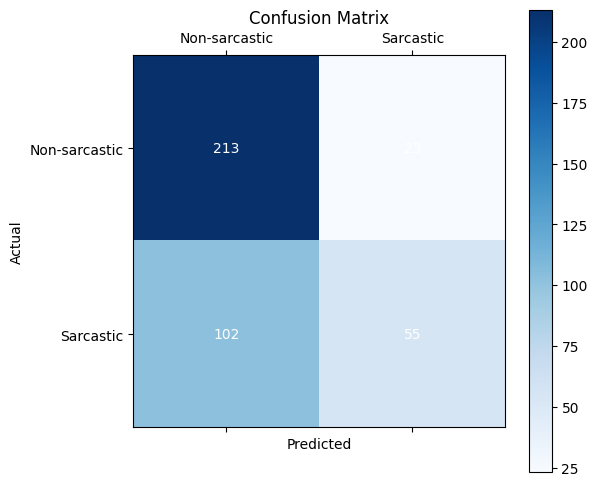

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Step 1: Compute the Confusion Matrix
# We need to get the true labels (y_test_tensor) and predicted labels (predicted)
y_test_tensor = y_test_tensor.cpu()  # Move to CPU for compatibility
predicted = predicted.cpu()  # Move to CPU for compatibility

cm = confusion_matrix(y_test_tensor, predicted)

# Step 2: Plot the Confusion Matrix using Matplotlib
fig, ax = plt.subplots(figsize=(6, 6))  # Create a figure and axis
cax = ax.matshow(cm, cmap='Blues')  # Display the confusion matrix

# Add color bar to the side
fig.colorbar(cax)

# Annotate the matrix with counts
for i in range(2):
    for j in range(2):
        ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='white')

# Set axis labels and title
ax.set_xticklabels([''] + ['Non-sarcastic', 'Sarcastic'])  # Add empty label for the top left
ax.set_yticklabels([''] + ['Non-sarcastic', 'Sarcastic'])  # Add empty label for the top left
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Confusion Matrix')

plt.show()


Epoch [1/50], Loss: 0.4128, Validation Loss: 0.6405, Train Accuracy: 0.8031, Validation Accuracy: 0.6718
Epoch [2/50], Loss: 0.3876, Validation Loss: 0.6419, Train Accuracy: 0.8082, Validation Accuracy: 0.6768
Epoch 00020: reducing learning rate of group 0 to 1.2500e-04.
Epoch [3/50], Loss: 0.3752, Validation Loss: 0.6503, Train Accuracy: 0.8139, Validation Accuracy: 0.6768
Epoch [4/50], Loss: 0.3638, Validation Loss: 0.6571, Train Accuracy: 0.8196, Validation Accuracy: 0.6768
Epoch [5/50], Loss: 0.3682, Validation Loss: 0.6649, Train Accuracy: 0.8164, Validation Accuracy: 0.6743
Epoch [6/50], Loss: 0.3595, Validation Loss: 0.6731, Train Accuracy: 0.8152, Validation Accuracy: 0.6718
Epoch 00024: reducing learning rate of group 0 to 6.2500e-05.
Epoch [7/50], Loss: 0.3483, Validation Loss: 0.6818, Train Accuracy: 0.8266, Validation Accuracy: 0.6743
Epoch [8/50], Loss: 0.3526, Validation Loss: 0.6861, Train Accuracy: 0.8311, Validation Accuracy: 0.6768
Epoch [9/50], Loss: 0.3510, Validati

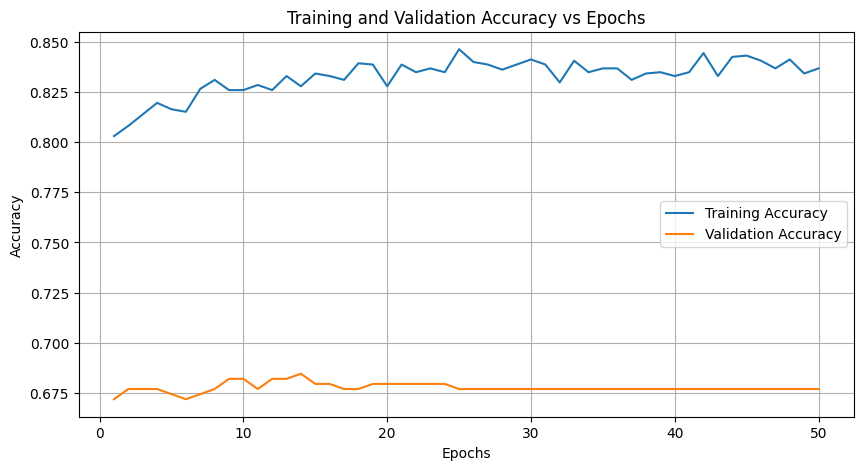

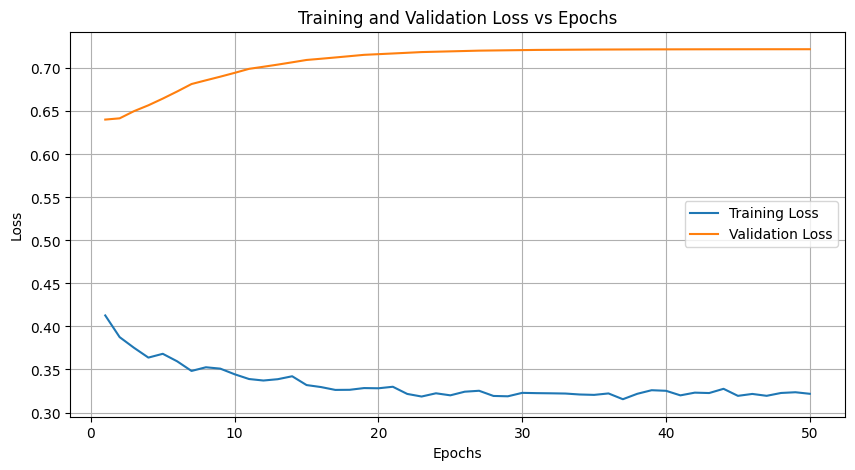

In [17]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Initialize lists to track metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training loop
num_epochs = 50
patience_counter = 0  # Reset patience counter since early stopping is removed
best_val_loss = float('inf')  # Initialize with a large value to track the best validation loss

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    
    # Forward pass
    outputs = model(X_train_tensor).squeeze(1)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    # Calculate training accuracy
    predicted_train = (outputs > 0.5).float()  # Apply threshold to classify
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted_train.cpu())
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
        
        # Calculate validation accuracy
        predicted_val = (val_outputs > 0.5).float()  # Apply threshold to classify
        val_accuracy = accuracy_score(y_test_tensor.cpu(), predicted_val.cpu())
    
    # Store metrics for plotting
    train_losses.append(loss.item())
    val_losses.append(val_loss.item())
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    # Print metrics after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, "
          f"Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Track the best validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter when there's improvement
    else:
        patience_counter += 1

# Check if the metrics have been tracked correctly
assert len(train_accuracies) == num_epochs, "Training accuracies list size mismatch!"
assert len(val_accuracies) == num_epochs, "Validation accuracies list size mismatch!"
assert len(train_losses) == num_epochs, "Training losses list size mismatch!"
assert len(val_losses) == num_epochs, "Validation losses list size mismatch!"

# Plot Accuracy vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


Epoch 00068: reducing learning rate of group 0 to 3.0518e-08.
Epoch [1/20], Loss: 0.3218, Validation Loss: 1.6338, Train Accuracy: 0.8362, Validation Accuracy: 0.6234
Epoch [2/20], Loss: 0.6176, Validation Loss: 1.8691, Train Accuracy: 0.8107, Validation Accuracy: 0.6260
Epoch [3/20], Loss: 1.1967, Validation Loss: 0.9304, Train Accuracy: 0.6966, Validation Accuracy: 0.5878
Epoch [4/20], Loss: 0.7732, Validation Loss: 0.8249, Train Accuracy: 0.6858, Validation Accuracy: 0.4809
Epoch 00072: reducing learning rate of group 0 to 1.5259e-08.
Epoch [5/20], Loss: 0.8066, Validation Loss: 0.6279, Train Accuracy: 0.5806, Validation Accuracy: 0.6616
Epoch [6/20], Loss: 0.4922, Validation Loss: 0.6608, Train Accuracy: 0.7610, Validation Accuracy: 0.6590
Epoch [7/20], Loss: 0.4620, Validation Loss: 0.7095, Train Accuracy: 0.7737, Validation Accuracy: 0.6565
Epoch [8/20], Loss: 0.4317, Validation Loss: 0.7638, Train Accuracy: 0.7935, Validation Accuracy: 0.6514
Epoch [9/20], Loss: 0.4184, Validati

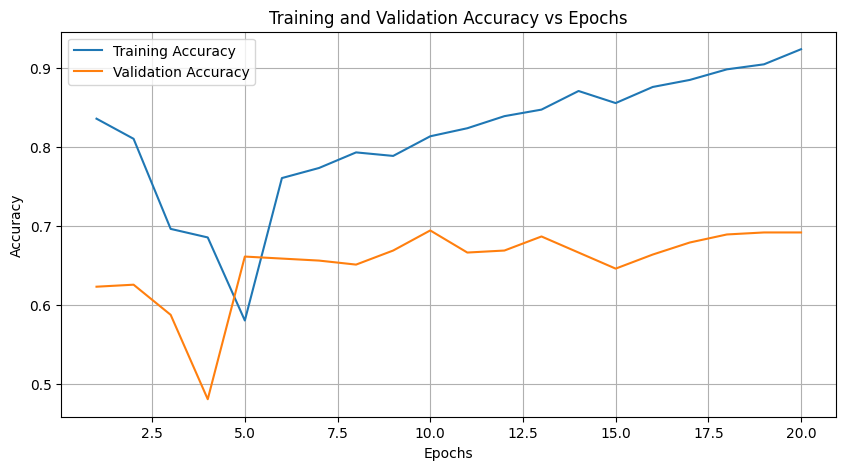

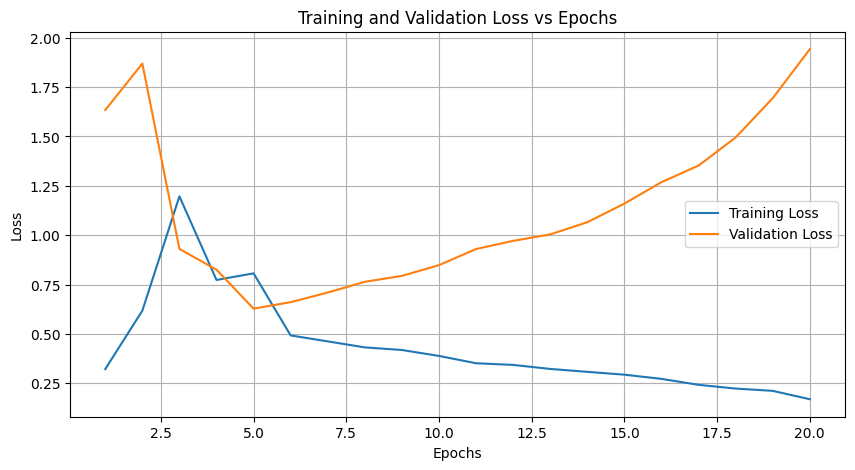

In [18]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Initialize lists to track metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training loop with regularization techniques
num_epochs = 20
patience_counter = 0  # Reset patience counter since early stopping is removed
best_val_loss = float('inf')  # Initialize with a large value to track the best validation loss

# Optimizer with L2 regularization (weight decay)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # L2 regularization added

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    
    # Forward pass
    outputs = model(X_train_tensor).squeeze(1)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    # Calculate training accuracy
    predicted_train = (outputs > 0.5).float()  # Apply threshold to classify
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted_train.cpu())
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
        
        # Calculate validation accuracy
        predicted_val = (val_outputs > 0.5).float()  # Apply threshold to classify
        val_accuracy = accuracy_score(y_test_tensor.cpu(), predicted_val.cpu())
    
    # Store metrics for plotting
    train_losses.append(loss.item())
    val_losses.append(val_loss.item())
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    # Print metrics after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, "
          f"Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Track the best validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter when there's improvement
    else:
        patience_counter += 1

# Check if the metrics have been tracked correctly
assert len(train_accuracies) == num_epochs, "Training accuracies list size mismatch!"
assert len(val_accuracies) == num_epochs, "Validation accuracies list size mismatch!"
assert len(train_losses) == num_epochs, "Training losses list size mismatch!"
assert len(val_losses) == num_epochs, "Validation losses list size mismatch!"

# Plot Accuracy vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [19]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import torch
import torch.optim as optim

# Initialize lists to track metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Early stopping parameters
patience = 5  # Number of epochs to wait for improvement
patience_counter = 0
best_val_loss = float('inf')

# Training loop with heavy regularization
num_epochs = 50

# Optimizer with increased L2 regularization (weight decay)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3)  # Increased L2 regularization

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    
    # Forward pass
    outputs = model(X_train_tensor).squeeze(1)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    # Calculate training accuracy
    predicted_train = (outputs > 0.5).float()  # Apply threshold to classify
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted_train.cpu())
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
        
        # Calculate validation accuracy
        predicted_val = (val_outputs > 0.5).float()  # Apply threshold to classify
        val_accuracy = accuracy_score(y_test_tensor.cpu(), predicted_val.cpu())
    
    # Store metrics for plotting
    train_losses.append(loss.item())
    val_losses.append(val_loss.item())
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    # Print metrics after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, "
          f"Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter when there's improvement
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered!")
            break

# Check if the metrics have been tracked correctly
assert len(train_accuracies) == num_epochs, "Training accuracies list size mismatch!"
assert len(val_accuracies) == num_epochs, "Validation accuracies list size mismatch!"
assert len(train_losses) == num_epochs, "Training losses list size mismatch!"
assert len(val_losses) == num_epochs, "Validation losses list size mismatch!"

# Plot Accuracy vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


Epoch [1/50], Loss: 0.1694, Validation Loss: 18.2455, Train Accuracy: 0.9242, Validation Accuracy: 0.5216
Epoch [2/50], Loss: 12.7103, Validation Loss: 2.2843, Train Accuracy: 0.5934, Validation Accuracy: 0.6565
Epoch [3/50], Loss: 0.5300, Validation Loss: 2.4036, Train Accuracy: 0.8031, Validation Accuracy: 0.6896
Epoch [4/50], Loss: 0.7837, Validation Loss: 1.7404, Train Accuracy: 0.8031, Validation Accuracy: 0.6743
Epoch [5/50], Loss: 0.5393, Validation Loss: 1.1153, Train Accuracy: 0.7916, Validation Accuracy: 0.6641
Epoch [6/50], Loss: 0.3609, Validation Loss: 0.8963, Train Accuracy: 0.8152, Validation Accuracy: 0.6310
Epoch [7/50], Loss: 0.3829, Validation Loss: 0.8201, Train Accuracy: 0.8247, Validation Accuracy: 0.6667
Epoch [8/50], Loss: 0.3999, Validation Loss: 0.7822, Train Accuracy: 0.8254, Validation Accuracy: 0.6794
Epoch [9/50], Loss: 0.3829, Validation Loss: 0.7686, Train Accuracy: 0.8247, Validation Accuracy: 0.6718
Epoch [10/50], Loss: 0.3811, Validation Loss: 0.7497,

AssertionError: Training accuracies list size mismatch!

Epoch [1/50], Loss: 0.2753, Validation Loss: 2.1837, Train Accuracy: 0.8719, Validation Accuracy: 0.6310
Epoch [2/50], Loss: 1.2727, Validation Loss: 0.7557, Train Accuracy: 0.7298, Validation Accuracy: 0.6183
Epoch [3/50], Loss: 0.3927, Validation Loss: 0.8247, Train Accuracy: 0.8082, Validation Accuracy: 0.5929
Epoch [4/50], Loss: 0.5318, Validation Loss: 0.7582, Train Accuracy: 0.7725, Validation Accuracy: 0.6310
Epoch [5/50], Loss: 0.4166, Validation Loss: 0.8313, Train Accuracy: 0.8113, Validation Accuracy: 0.6361
Epoch [6/50], Loss: 0.3806, Validation Loss: 0.9178, Train Accuracy: 0.8260, Validation Accuracy: 0.6692
Epoch [7/50], Loss: 0.3772, Validation Loss: 0.9764, Train Accuracy: 0.8330, Validation Accuracy: 0.6692
Epoch [8/50], Loss: 0.3392, Validation Loss: 0.9897, Train Accuracy: 0.8458, Validation Accuracy: 0.6768
Epoch [9/50], Loss: 0.2932, Validation Loss: 1.0390, Train Accuracy: 0.8655, Validation Accuracy: 0.6896
Epoch [10/50], Loss: 0.2657, Validation Loss: 1.1075, T

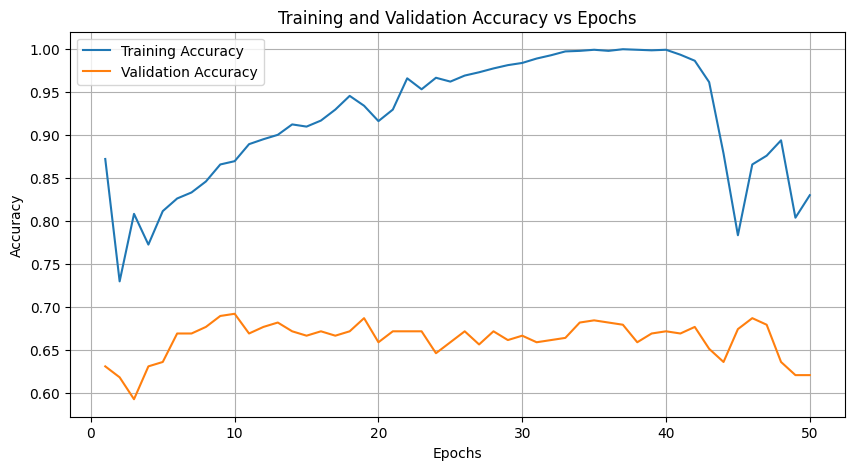

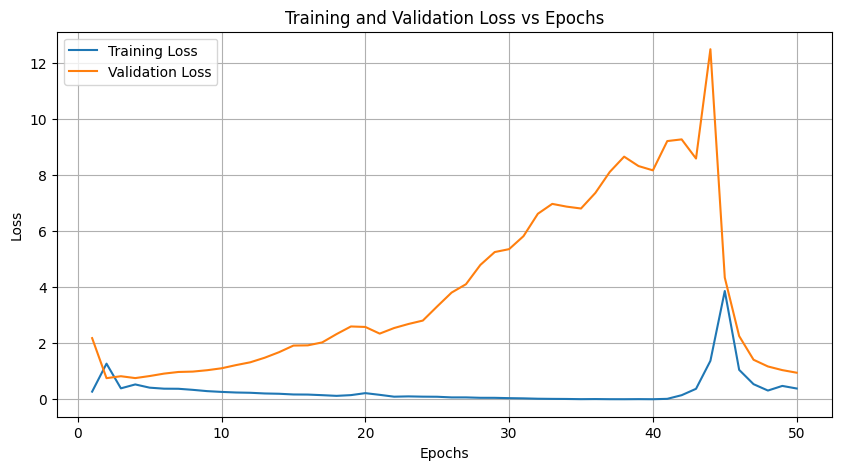

In [20]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import torch
import torch.optim as optim

# Initialize lists to track metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training loop with heavy regularization
num_epochs = 50

# Optimizer with increased L2 regularization (weight decay)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3)  # Increased L2 regularization

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    
    # Forward pass
    outputs = model(X_train_tensor).squeeze(1)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    # Calculate training accuracy
    predicted_train = (outputs > 0.5).float()  # Apply threshold to classify
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted_train.cpu())
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
        
        # Calculate validation accuracy
        predicted_val = (val_outputs > 0.5).float()  # Apply threshold to classify
        val_accuracy = accuracy_score(y_test_tensor.cpu(), predicted_val.cpu())
    
    # Store metrics for plotting
    train_losses.append(loss.item())
    val_losses.append(val_loss.item())
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    # Print metrics after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, "
          f"Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")

# Check if the metrics have been tracked correctly
assert len(train_accuracies) == num_epochs, "Training accuracies list size mismatch!"
assert len(val_accuracies) == num_epochs, "Validation accuracies list size mismatch!"
assert len(train_losses) == num_epochs, "Training losses list size mismatch!"
assert len(val_losses) == num_epochs, "Validation losses list size mismatch!"

# Plot Accuracy vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Initialize lists to track metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training loop with regularization techniques
num_epochs = 300
patience_counter = 0  # Reset patience counter since early stopping is removed
best_val_loss = float('inf')  # Initialize with a large value to track the best validation loss

# Optimizer with L2 regularization (weight decay)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # L2 regularization added

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()  # Zero the gradients before the backward pass
    
    # Forward pass
    outputs = model(X_train_tensor).squeeze(1)
    loss = criterion(outputs, y_train_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    # Calculate training accuracy
    predicted_train = (outputs > 0.5).float()  # Apply threshold to classify
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted_train.cpu())
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_test_tensor).squeeze(1)
        val_loss = criterion(val_outputs, y_test_tensor)
        
        # Calculate validation accuracy
        predicted_val = (val_outputs > 0.5).float()  # Apply threshold to classify
        val_accuracy = accuracy_score(y_test_tensor.cpu(), predicted_val.cpu())
    
    # Store metrics for plotting
    train_losses.append(loss.item())
    val_losses.append(val_loss.item())
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    
    # Adjust learning rate if validation loss does not improve
    lr_scheduler.step(val_loss)
    
    # Print metrics after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, "
          f"Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Track the best validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0  # Reset patience counter when there's improvement
    else:
        patience_counter += 1

# Check if the metrics have been tracked correctly
assert len(train_accuracies) == num_epochs, "Training accuracies list size mismatch!"
assert len(val_accuracies) == num_epochs, "Validation accuracies list size mismatch!"
assert len(train_losses) == num_epochs, "Training losses list size mismatch!"
assert len(val_losses) == num_epochs, "Validation losses list size mismatch!"

# Plot Accuracy vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs+1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy vs Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss vs Epochs
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid(True)
plt.show()
